<br>
<h1 align=center>Smart Beta: An Exploration of Factor Investing</h1>
<h3 align=center>Data Bootcamp</h3>
<h3 align=center>Spring 2021 Final Porject</h3>
<h3 align=center>Jane Wang, Veronica Hu</h3>
<br>

<div class="alert alert-danger alertdanger" style="margin-top: 20px">
    <h2>Introduction</h2>

### 1 Capital Asset Pricing Model

\begin{align*}
R_{i} - R_{f} = \alpha_{i} + \beta(R_{M} - R_{f})
\end{align*}

A classical model to compute the expected return of an asset, based on risk free rate and market risk premium.

### 2 Fama French Three-Factor Model

- Expands on CAPM by adding **size risk** and **value risk** factors to the market risk factors
- Considers the fact that **value and small-cap stocks outperform markets on a regular basis**

**The Fama and French model has three factors:**
- **Excess return on the market**: i.e. the market return less the risk free rate of return <br>
- **Size of firms:** meausred by SMB (small minus big) <br>
It accounts for publicly traded companies with small market caps that generate higher returns. <br>
Below is the visualized performance of **Size factor** from Bloomberg, which also suggests that smaller size tends to outperform bigger size:
![SMB](Bloomberg_SMB.png)
<br>
- **Book-to-market values:** measured by HML (high minus low) <br>
It accounts for value stocks with high book-to-market ratios that generate higher returns in comparison to the market. <br>
Below is the visualized performance of **Value factor** from Bloomberg, which also suggests that higher value tends to outperform lower value:
![HML](Bloomberg_HML.png)
<br>

**The Formula is:**

\begin{align*}
R_{i} - R_{f} = \alpha_{i} + \beta_{1}(R_{M} - R_{f}) + \beta_{2}SMB + \beta_{3}HML + \epsilon_{i}
\end{align*}

Where: <br>
$R_{i}$ = total return of a stock or portfolio *i* <br>
$R_{f}$ = risk free return <br>
$R_{i} - R_{f}$ = expected excess return <br>
$R_{M}$ = total market portfolio return <br>
$R_{M} - R_{f}$ = market risk premium <br>
$SMB$ = size premium <br>
$HML$ = value premium <br>
$\beta_{1,2,3}$ = factor coefficients

<div class="alert alert-danger alertdanger" style="margin-top: 20px">
    <h2>Data Cleaning and Preprocessing</h2>

### 1 Three Factors Dataset (Kenneth French)

Souce: [Kenneth R. French's public online data library](https://mba.tuck.dartmouth.edu/pages/faculty/ken.french/data_library.html). <br>
It contains historical monthly values of the SMB, HML, market return and risk-free return from 1926/7 to 2021/2.

In [1]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib as mpl
import seaborn as sb

In [2]:
ff3 = pd.read_csv('factors.csv', index_col=0)
ff3 = ff3/100 # since the original values are in percentage, devide by 100 to get numeric values 
ff3.index= pd.to_datetime(ff3.index, yearfirst=True, format='%Y%m')

In [3]:
ff3.head()

,Mkt-RF,SMB,HML,RF
1926-07-01,0.0296,-0.0230,-0.0287,0.0022
1926-08-01,0.0264,-0.0140,0.0419,0.0025
1926-09-01,0.0036,-0.0132,0.0001,0.0023
1926-10-01,-0.0324,0.0004,0.0051,0.0032
1926-11-01,0.0253,-0.0020,-0.0035,0.0031


In [4]:
factors = ff3.iloc[:, [0, 1, 2]]

### 2 25 Portfolios Dataset (Kenneth French)
Source: same as previous one <br>
It contains historical monthly return of 25 different portfolios from 1926/7 to 2021/2. <br>
The portfolios are sorted and measured by different degrees of ME and BM. E.g. SMALL LoBM means the portfolio contains small size and low book-to-market ratio stocks.

In [5]:
ptf = pd.read_csv('portfolio.csv', index_col=0)
ptf = ptf/100
ptf.index= pd.to_datetime(ptf.index, yearfirst=True, format='%Y%m')

In [6]:
p25 = ptf.sub(ff3['RF'], axis=0)
p25.head()

,SMALL LoBM,ME1 BM2,ME1 BM3,ME1 BM4,SMALL HiBM,ME2 BM1,ME2 BM2,ME2 BM3,ME2 BM4,ME2 BM5,...,ME4 BM1,ME4 BM2,ME4 BM3,ME4 BM4,ME4 BM5,BIG LoBM,ME5 BM2,ME5 BM3,ME5 BM4,BIG HiBM
1926-07-01,0.035582,-0.006319,-0.021634,0.001330,0.018334,0.019704,0.021992,0.002726,-0.017970,-0.005544,...,0.013693,0.013078,0.009669,0.000527,0.022478,0.032339,0.058702,0.018066,0.028911,0.003423
1926-08-01,-0.024574,-0.089775,0.021904,0.003586,0.081468,0.019209,-0.014349,0.037584,0.002143,0.059175,...,0.010836,0.036230,0.017559,0.019206,0.050922,0.007624,0.039403,0.017631,0.052349,0.075076
1926-09-01,-0.064413,-0.005289,-0.064282,-0.018668,0.006349,-0.020850,-0.014918,0.008529,-0.032705,-0.011701,...,0.008623,-0.007550,-0.019614,0.012346,0.006430,-0.015206,0.034238,-0.001350,-0.009787,-0.026584
1926-10-01,-0.089441,-0.040732,-0.059919,0.053970,-0.028676,-0.021195,-0.035863,-0.053945,-0.083650,-0.016413,...,-0.036561,-0.029759,-0.023516,-0.034251,-0.056725,-0.030613,-0.033271,-0.025637,-0.049919,-0.061329
1926-11-01,0.031644,0.063376,0.019534,-0.050120,0.002262,0.025951,-0.026790,0.026978,0.043549,0.024192,...,0.031348,0.020787,0.034303,0.046220,0.015113,0.039846,0.022226,0.012104,0.033519,0.022536


### 3 U.S. Mutual Funds

Source: WRDS

In [25]:
df_mf = pd.read_csv('mutual fund data.csv')
df_mf.head()

/Users/jqh/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3057: DtypeWarning:

Columns (3,5) have mixed types. Specify dtype option on import or set low_memory=False.



,ticker,caldt,crsp_fundno,mtna,mret,mnav
0,AABIX,19970829,1,46.629,-0.010477,15.0700000
1,AABIX,19970930,1,57.900,0.014313,15.2000000
2,AABIX,19971128,1,75.033,0.006949,15.2600000
3,AABIX,19970530,1,26.157,0.013523,14.8700000
4,AABIX,19970228,1,3.926,R,14.9800000


#### Dataset description:
- ticker
- caldt: date of row
- crsp_fundno: a unique fund number
- mtna: total net asset value
- mret: return per share
- mnav: net asset value per share

In [26]:
# transform 'caldt' into date values
df_mf['year'] = pd.to_datetime(df_mf['caldt'].astype('str')).dt.year
df_mf['month'] = pd.to_datetime(df_mf['caldt'].astype('str')).dt.month
df_mf['date'] = pd.to_datetime(df_mf['year'].astype('str')+'-'+df_mf['month'].astype('str'))

In [27]:
# Since some of the returns are uncollectable (filled with 'R'), we drop the corresponding rows
df_mf['mret'] = pd.to_numeric(df_mf['mret'], errors='coerce')
df_mf.dropna(axis = 0, subset = ['mret'], inplace=True)

<div class="alert alert-danger alertdanger" style="margin-top: 20px">
    <h2>Regression Analysis</h2>

### 1 Regression on 25 Portfolios

In [10]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib as mpl
import seaborn as sb

In [11]:
start = '1970-1'
end = '2020-12'
X = factors[start:end]
y = p25[start:end]

In [12]:
X = sm.add_constant(X)

In [13]:
%%time
reg = sm.OLS(y, X).fit()
params = reg.params
params = params.transpose()

Wall time: 17.7 ms


In [15]:
# Label the 25 porfolios according to their degress of ME (size) and BM (value)
params['ME'] = [1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5]
params['BM'] = [1, 2, 3, 4, 5, 1, 2, 3, 4, 5, 1, 2, 3, 4, 5, 1, 2, 3, 4, 5, 1, 2, 3, 4, 5]
params

,const,Mkt-RF,SMB,HML,ME,BM
0,-0.005436,1.111306,1.343937,-0.300652,1,1
1,0.000485,0.966295,1.312574,0.007742,1,2
2,-0.000296,0.931473,1.079348,0.299599,1,3
3,0.001599,0.885351,1.061310,0.462335,1,4
4,0.001158,0.960116,1.054524,0.673850,1,5
5,-0.001920,1.143317,0.993704,-0.358902,2,1
6,0.000565,1.016403,0.910190,0.124836,2,2
7,0.000519,0.974244,0.737151,0.400831,2,3
8,0.000548,0.954912,0.720454,0.575518,2,4
9,-0.000346,1.088126,0.896264,0.792144,2,5


#### Visulize the Performance of Size Factor (SMB)

Text(0.5, 33.0, 'Book-to-Market')

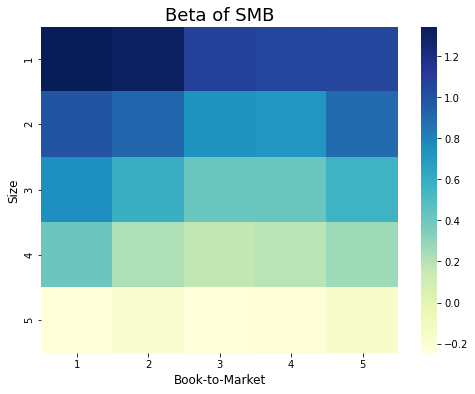

In [16]:
fig, ax = plt.subplots(figsize=(8, 6))
sb.heatmap(params.pivot(index='ME', columns='BM', values='SMB'), cmap='YlGnBu')
ax.set_title('Beta of SMB', size=18)
ax.set_ylabel('Size', size=12)
ax.set_xlabel('Book-to-Market', size=12)

#### Conclusion:
- The smaller the Size of a portfolio, the higher the beta of SMB

#### Visulize the Performance of Value Factor (HML)

Text(0.5, 33.0, 'Book-to-Market')

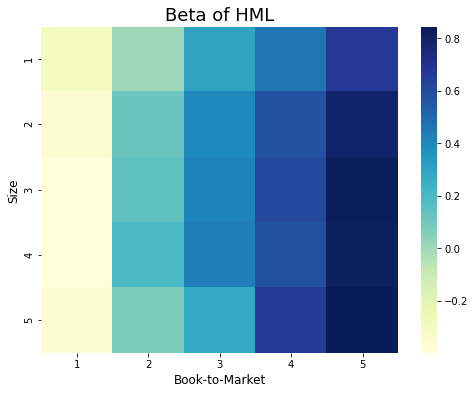

In [20]:
fig, ax = plt.subplots(figsize=(8,6))
sb.heatmap(params.pivot(index='ME', columns='BM', values='HML'), cmap='YlGnBu')
ax.set_title('Beta of HML', size=18)
ax.set_ylabel('Size', size=12)
ax.set_xlabel('Book-to-Market', size=12)

#### Conclusion:
- The higher the Book-to-Market ratio of a portfolio, the higher the beta of HML

### 2 Regression on U.S. Mutual Funds

In [48]:
def regress_beta(n):
    mf = df_mf.loc[df_mf['crsp_fundno']==n, :].sort_values('date').set_index('date')
    mf['return'] = pd.to_numeric(mf['mret'], errors='coerce')
    df = mf[['return']].join(ff3).dropna()
    df['R-RF'] = df['return'].sub(df['RF'], axis=0)
    df = sm.add_constant(df)
    X = df.iloc[:, [0, 2, 3, 4]]
    y = df.iloc[:, [6]]
    reg = sm.OLS(y, X).fit()
    score = reg.rsquared
    beta = pd.DataFrame(reg.params)
    beta.columns = [n]
    return beta, score

In [29]:
counts = df_mf.groupby('crsp_fundno').agg({'date':'count'})
counts.describe()

,date
count,68686.000000
mean,117.196940
std,98.108308
min,1.000000
25%,43.000000
50%,91.000000
75%,160.000000
max,711.000000


- 25% mutual funds have records less than 43 rows
- For regression results to be significant, we set the threshold number of rows to be 60 (5 years) for each mutual funds

In [30]:
fund = counts.loc[counts['date']>60, :].index.tolist()

In [54]:
print('Number of mutual funds:', len(fund))

Number of mutual funds: 44581


- Due to large size of dataset, we fit regression models with subsets instead of running the entire dataset in a single loop

In [71]:
%%time
subset1 = list(np.array_split(fund, 8)[0])
beta = regress_beta(subset1[0])[0]
scores = [regress_beta(subset1[0])[1]]
for i in range(1, len(subset1)):
    beta_t, score = regress_beta(subset1[i])
    beta = beta.join(beta_t)
    scores.append(score)
    print(subset1[i], score)
beta_subset1 = beta.transpose()
beta_subset1['scores'] = scores

8 0.7557905926281762
9 0.7685957455821405
10 0.8226728314090174
11 0.4386488336230614
12 0.8800922630937583
13 0.5927021377912556
15 0.5777576277492147
16 0.5684898960416929
18 0.26709746106867105
21 0.09167807186612176
27 0.24690675604297274
35 0.7681638291756988
36 0.5432408752260793
37 0.1272854817931991
38 0.37739376752834797
44 0.48477833724424646
52 0.15040470543483586
53 0.8827520670546622
55 0.06597253299538797
56 0.06752652803855996
57 0.07141051485393224
58 0.7918318332976699
59 0.7904898748597255
60 0.793147252099577
61 0.021525700152551508
64 0.7998422696799746
68 0.26361052977174515
71 0.1814899406295788
72 0.06847215726342037
76 0.7672107851626097
78 0.17659888766120513
80 0.05694595182948081
81 0.013889699122375143
82 0.16812420801746175
83 0.9046230081675988
84 0.16267936263662075
85 0.15638535596214242
86 0.10980205842876212
89 0.03140625216454007
91 0.549770695163244
93 0.6975851448485202
94 0.05892562493317932
95 0.049381470037478614
96 0.8406902365240615
99 0.034327

776 0.17022459616835928
777 0.18276410197648907
778 0.0378024279578012
779 0.19600886636995485
791 0.22393441621533017
792 0.35396237724241986
793 0.9056528686298383
794 0.3010250432560335
796 0.456878367733478
798 0.22310589636276135
799 0.03318623709336399
800 0.03952898882314204
802 0.9219531266403975
803 0.9224560336260638
808 0.04515893668743409
815 0.31444835248361724
816 0.9057674290996248
817 0.2534157451212943
819 0.2736132569747922
821 0.2637281219237051
822 0.13354559929568055
823 0.05468898235869879
825 0.10128342774676113
826 0.7809713068426518
827 0.27373793489429665
828 0.33779073562834694
830 0.8136003084134559
831 0.8312212398590839
833 0.03408781064859523
835 0.018343742379757666
836 0.23507366628601
838 0.052425177523907074
840 0.15486561548404676
842 0.8102418236154687
843 0.8207216543984126
844 0.8066600806273037
846 0.26921328433325586
847 0.07972256987209081
848 0.35990638837324884
850 0.8370457851354014
851 0.37722720389562603
853 0.27271577375728895
854 0.00574

1569 0.22682287083832975
1570 0.7274924464677197
1573 0.9018429968692392
1574 0.8594709338729971
1575 0.8731718711302074
1576 0.20801349745929587
1582 0.12493669849706801
1583 0.309006045632497
1584 0.8716776807513125
1587 0.8177345916067345
1588 0.8161579775772577
1590 0.5840272834887007
1592 0.2502056324693608
1593 0.28105849569655206
1595 0.29320941575637127
1597 0.07540009648972101
1598 0.030204374388565935
1599 0.860232343453021
1601 0.7541322233175234
1603 0.17286770429921072
1604 0.024493205789609007
1605 0.03359714447419071
1609 0.2638534854382171
1624 0.8591437125931238
1626 0.41662943777814854
1628 0.004635610566295134
1642 0.8175989402835936
1646 0.8528131440362148
1647 0.10825775447352093
1648 0.22206451426093454
1649 0.7420208407984477
1651 0.8756681845664174
1653 0.02038644759857844
1654 0.09467224862919543
1655 0.8986738601905109
1657 0.9107812463058185
1662 0.20989068056574245
1663 0.21038678229383456
1665 0.4205618217282885
1676 0.029793229531922427
1679 0.342822152471

2294 0.2684981746187103
2298 0.12974488691679298
2299 0.842174113302335
2300 0.47956284217491496
2301 0.027139794155431995
2302 0.28901554596597856
2303 0.2554812910397205
2305 0.8561904463721489
2306 0.3710831776293314
2307 0.7835254445524409
2308 0.49789198391951606
2309 0.1187226175893138
2310 0.11972209732571204
2311 0.3453657467350062
2312 0.03873233739140003
2320 0.08281603258714954
2322 0.6311379520663793
2323 0.5129039834930427
2325 0.8659371037669195
2330 0.1619051737573569
2332 0.528368259091011
2333 0.803436212620521
2335 0.3113850980347941
2336 0.4491864636791775
2337 0.8252848049201085
2339 0.08017585378377445
2342 0.22113146576080533
2343 0.3167684197780226
2344 0.1324423037213871
2345 0.8056007327321303
2346 0.49354107154881455
2347 0.6826917474478051
2348 0.24745983757757528
2349 0.050432209232033065
2351 0.11817344010249431
2356 0.788811416777272
2357 0.3830194314464055
2358 0.14856197048917852
2360 0.9350873953138519
2361 0.2250854266763307
2362 0.3379273665720559
236

2937 0.9200692903989568
2938 0.9201075692255724
2939 0.8889754563252555
2940 0.8889401969687736
2941 0.09079075797401981
2942 0.8880263257589517
2943 0.8364571623148381
2944 0.8361119301462041
2945 0.8362054370538226
2946 0.05504800190607084
2947 0.055044320103977196
2948 0.9008245721199285
2949 0.8053345356632241
2950 0.8999831693438387
2951 0.9221945558199447
2952 0.9094276434410757
2953 0.8916260187394773
2954 0.9055617899458914
2955 0.8902431223142432
2956 0.9246342869681575
2957 0.8901502189816006
2958 0.9515659624711604
2959 0.8667628624445181
2960 0.9251196266115742
2961 0.9346947622403499
2962 0.9222265529855415
2963 0.9346652078900992
2964 0.01007608272220506
2965 0.21539613423580817
2966 0.010541121680893495
2967 0.033105405804799926
2968 0.03269303061104578
2969 0.03292361137068145
2970 0.0004984040725949379
2971 0.12367923238564915
2972 0.028034438705096032
2973 0.006918488111405496
2977 0.4326122922601511
2978 0.3861017656325423
2979 0.38377347978708365
2980 0.595191291308

3367 0.8511231324301965
3368 0.7255674228892527
3369 0.8991452206254638
3370 0.8977751660875716
3371 0.899339062554086
3372 0.898687956785039
3373 0.05791072529273256
3374 0.033552548718284836
3375 0.45102802175990164
3376 0.8901054737949207
3377 0.8866933172898442
3378 0.40743364291897954
3379 0.39434077147365243
3380 0.4051095520432798
3381 0.4620551480623669
3382 0.6126878345523945
3383 0.6363622837979863
3384 0.01676023306073715
3385 0.01745824228171655
3386 0.020995452903292633
3387 0.8828115330924248
3388 0.8831141002533345
3389 0.8837332538511649
3390 0.8627202491971834
3391 0.8294583906406732
3392 0.8482473796549445
3393 0.8717167935178811
3394 0.8237135875290194
3395 0.8235699933382897
3396 0.8239506966009711
3397 0.06490257696752166
3398 0.02410789209207398
3399 0.035039599938887056
3400 0.9270278358796444
3401 0.8658535173123176
3402 0.8661825407519665
3403 0.8653233166127695
3404 0.9264328045090098
3405 0.9263497489172436
3406 0.11376288162816217
3407 0.6077814403575642
340

3759 0.17305508590950247
3760 0.6789462325791429
3761 0.8276503943842867
3762 0.7929782394497251
3763 0.7940062580186131
3764 0.7772162131840226
3765 0.7695333049104526
3766 0.7862037085982263
3767 0.7669218786072833
3768 0.8556711203675634
3769 0.7560348104130296
3770 0.6958927994124564
3771 0.6258659818702057
3772 0.7775991085404974
3773 0.6969417994416232
3774 0.19076495370288848
3775 0.17245635146040939
3776 0.8634418222358942
3777 0.8245213182570339
3778 0.6256145244398814
3779 0.6050257915475508
3780 0.625213584851597
3781 0.5751899161803447
3782 0.5766289937209399
3783 0.5757240196996227
3784 0.8030802029827291
3785 0.8050475310982198
3786 0.802322963891279
3787 0.6834010642638269
3788 0.6829795293097796
3789 0.6831918221328974
3790 0.7310826759046989
3791 0.730581179045938
3792 0.7306923334433346
3793 0.6241972514433478
3794 0.6115781946489098
3795 0.6254791427499118
3796 0.6230148533891715
3797 0.6231523229553222
3799 0.6340519675413041
3800 0.6333867711853592
3801 0.635693197

4230 0.021447739283537492
4231 0.01459472657726113
4235 0.04235212951040823
4236 0.04265906633922367
4237 0.04117967768118547
4238 0.014223825666169532
4239 0.014161735054006752
4240 0.014774110410062713
4241 0.011152667683778206
4242 0.011655096348925031
4243 0.011269245543518713
4244 0.024735605150872253
4245 0.02553347659654348
4246 0.025114319050508538
4247 0.00856674047014816
4248 0.00707108768659781
4249 0.009029083337867894
4250 0.01297502043303067
4251 0.01257858471619111
4252 0.01297351213161091
4253 0.02881079542056375
4254 0.020690302507024083
4255 0.018387435836514254
4256 0.02074292062119376
4257 0.027834593478758274
4258 0.01857517403578879
4259 0.025284368402368806
4260 0.030091798534720327
4261 0.021188592579473697
4262 0.5246162582256211
4263 0.5526619126254511
4264 0.6002611402383137
4265 0.6301811242004647
4266 0.8691573178912491
4267 0.8668876314403032
4268 0.8714203084825322
4269 0.8776116634476947
4270 0.8688829300725928
4271 0.8684886532648753
4272 0.868395416403

4590 0.7062221285044017
4591 0.7181648116006666
4592 0.7173507701346826
4593 0.7234372045637979
4594 0.5694777141777809
4595 0.5550865063908672
4596 0.554462196578548
4597 0.5565778797433216
4598 0.5552170829316796
4599 0.34017363160299263
4600 0.3401670542177363
4601 0.34053292994211715
4602 0.5718998561390001
4603 0.6298043702918673
4604 0.6404726516368017
4605 0.6270028939995687
4606 0.5465152635232534
4607 0.8076453223884911
4608 0.8104760516067705
4609 0.8177448387734579
4610 0.8107857007170384
4611 0.8117736716818049
4612 0.8444459336037966
4613 0.8802043770674088
4614 0.8706413415026846
4615 0.880451847317317
4616 0.83169616295524
4617 0.8427053272255081
4618 0.8253006164608605
4619 0.8282659868106506
4620 0.8293234931014661
4621 0.828694477836071
4622 0.8317367381906563
4623 0.7049277079512926
4624 0.797889378582253
4625 0.7980534885109131
4626 0.799268990315517
4627 0.7991258710857176
4628 0.6946654470797822
4629 0.86767790821795
4630 0.9037947214036091
4631 0.9036108212344025

4968 0.8248470561934507
4969 0.825518469789659
4970 0.8401346537826797
4971 0.8390552228799677
4972 0.8445400069061592
4973 0.8389594962683276
4974 0.042538641122060517
4975 0.050821161507105694
4976 0.9704142677136492
4977 0.9721665361160597
4978 0.9718886576662394
4979 0.7563027725760754
4980 0.7581117260998305
4981 0.758363544380777
4982 0.7575675168133581
4984 0.96496935370587
4985 0.7572506426508442
4986 0.9593011183499833
4987 0.9592693092060178
4988 0.9588217675662436
4989 0.9588668794762722
4990 0.009541698270912669
4991 0.008590129833056404
4992 0.9715914397328567
4993 0.00983136980778987
4994 0.008319219355242602
4995 0.012809042322156405
4996 0.008426535467791041
4997 0.9776240617301704
4998 0.9542205358081439
4999 0.9713650002531874
5000 0.9778311282440053
5001 0.9714049517712068
5002 0.9740676738150564
5003 0.9350273410155621
5004 0.9233367822373073
5005 0.921501753844953
5007 0.43124808821486493
5008 0.5579802076192062
5009 0.4471196032689756
5010 0.06490728319705852
5011

5348 0.9270739517815447
5349 0.9265803390744568
5350 0.9002470842291022
5351 0.9024616833315982
5354 0.7086608274015305
5361 0.8627087355502304
5362 0.7714017139310013
5363 0.7137106248559915
5364 0.8382790337029993
5369 0.48360975697847075
5371 0.5658372665485814
5372 0.61389097397724
5373 0.6110286391488753
5374 0.6289784396111593
5375 0.4042998774224821
5376 0.9318188189391153
5377 0.9330016991594844
5378 0.9333984933169375
5379 0.9169885344528323
5380 0.9160666185244162
5381 0.9174219041455552
5382 0.8392724617457877
5383 0.855414086287098
5384 0.8543867916108392
5385 0.8548900880139387
5386 0.8519602449949366
5387 0.8519057462703932
5388 0.8760206187961341
5389 0.8874549061367077
5390 0.8848194857970932
5391 0.8930483084445006
5392 0.04971921515778288
5393 0.015316770822581871
5394 0.12181628539231859
5395 0.5970555705353924
5396 0.5969610260199044
5397 0.980299570825523
5398 0.03070738372152415
5399 0.9799236956078806
5400 0.9795690185351072
5401 0.6682317231127899
5402 0.0398154

5814 0.028923830926027683
5815 0.02631604462046988
5816 0.7199981723792968
5817 0.7217070368152612
5818 0.8315032733611456
5819 0.8338448033020561
5820 0.9458265151364251
5821 0.9450876847680968
5826 0.9353695458064891
5827 0.2562778588122576
5828 0.04585067355232442
5829 0.014293014892344691
5830 0.4050286106772494
5831 0.8531635199025567
5832 0.8442745208561242
5833 0.00569364330274158
5834 0.17452515171696026
5835 0.013091197598494198
5836 0.012869356725342729
5837 0.013015205991479872
5840 0.013606632218693737
5841 0.8903465115733324
5842 0.8909584747191273
5843 0.9158505355084242
5844 0.9163167274306742
5845 0.018282338104522622
5846 0.01805438340204868
5847 0.021769643903736702
5848 0.02153870548497261
5882 0.8765143899753601
5886 0.025161805722338948
5887 0.5104580804192461
5888 0.8827978552130471
5889 0.006547328884801362
5890 0.7724588098901397
5891 0.05153959398911567
5892 0.02014185879106234
5893 0.02977204889526719
5894 0.013718854036046002
5895 0.00356620536797414
5896 0.0

6231 0.8106169783552828
6232 0.5175468686309173
6233 0.5189159942027484
6234 0.5190418903773666
6235 0.4814868431891125
6236 0.5180925357089234
6237 0.5190403762547358
6238 0.024381597253439802
6239 0.006303232739879205
6240 0.027493209751567993
6241 0.02705096556172626
6242 0.021929367153225465
6243 0.02346993246386586
6244 0.002632677213748047
6245 0.7288783452887158
6246 0.7289450001805087
6247 0.7291698493223161
6248 0.7527742442443535
6249 0.006464371620301335
6250 0.7289825067225872
6251 0.011297906344317932
6253 0.010293475674703179
6254 0.011293181073223524
6255 0.010773051590447946
6256 0.006393289661993817
6257 0.006422879455281749
6258 0.22461614735774893
6259 0.9343621945867064
6260 0.9347088418123803
6261 0.8873531593001567
6262 0.8881445381931475
6263 0.7769628690070381
6264 0.7762758537505088
6266 0.8490645339350946
6267 0.8795389462913876
6268 0.8496740977841963
6270 0.8496889821431963
6271 0.5248992705769624
6272 0.5254090744720732
6273 0.23697490563486534
6274 0.52469

6598 0.032498901833164284
6599 0.9533278264103345
6600 0.9347057150054836
6601 0.9349749946970974
6602 0.8878911020214764
6603 0.8891982285316054
6604 0.7766974477660433
6605 0.7760400275446387
6606 0.9532109408275816
6607 0.9536119526153217
6608 0.03301643375661334
6609 0.038978720385530075
6610 0.046048325560064884
6611 0.04462753525818863
6612 0.045755723498540624
6613 0.08521931310098074
6614 0.8051961837165731
6615 0.8093546495508136
6616 0.8499836653990098
6617 0.9133847073469581
6618 0.9081982791768393
6619 0.9087238947794057
6620 0.7327788015739638
6621 0.7323169623064453
6622 0.7328540877144606
6623 0.591020185378432
6624 0.03602963700452011
6625 0.5907582995564384
6626 0.5912077263159523
6627 0.7729348111819492
6628 0.7708052640090972
6629 0.7719255836626733
6630 0.9138379830747954
6631 0.006160199196487359
6632 0.9136314818907469
6633 0.7634859839156187
6636 0.6830548683359978
6642 0.8734842157635307
6643 0.8737869557141102
6644 0.8587082437692869
6645 0.857810502441967
6646

7006 0.1715274851467663
7007 0.24009957756084288
7008 0.06376268524045303
7009 0.14762907610111353
7010 0.9777636864517919
7011 0.978533368665534
7012 0.9757664584589033
7013 0.9780354307909758
7014 0.14812431737623133
7017 0.8624522201635597
7018 0.10039188487436856
7019 0.8354696205133262
7020 0.019212555280408883
7021 0.006360951721060992
7022 0.3156824048253337
7024 0.8883497327762133
7025 0.00973263085655951
7026 0.8721005851898176
7027 0.0519379594388093
7028 0.9190304730240394
7029 0.02867120585146543
7030 0.9436216216833035
7031 0.9683137819598385
7032 0.8389643262541414
7033 0.8400132583470473
7034 0.8570652031315655
7035 0.9573794169092219
7036 0.9576090035932656
7040 0.030510823053676805
7041 0.8982706279802506
7042 0.9726597404801787
7044 0.016778469979621735
7045 0.9244497347125403
7046 0.9094192709333391
7048 0.9731607709858356
7049 0.9729785055557967
7050 0.8452190565362284
7051 0.845656966329957
7052 0.8457403658265729
7053 0.8526999073121245
7054 0.9208671882318817
705

7422 0.017109201976821753
7423 0.045448712095745414
7424 0.08286123284344693
7425 0.03599452332335007
7426 0.0338503005386539
7427 0.02981773773209473
7428 0.905979045931017
7432 0.9900959725066094
7436 0.03456009429193363
7440 0.020921500517006586
7445 0.8301698728089058
7446 0.8300816906914984
7447 0.828037272158588
7449 0.5422419919276946
7450 0.5428669951753747
7451 0.5419498268268597
7453 0.39134668000589656
7454 0.4149557781818983
7455 0.41519613098523156
7456 0.39141818005272355
7457 0.3907328264267945
7465 0.08926535518248391
7468 0.7836910485686628
7469 0.6064725179452775
7470 0.6070790989490437
7472 0.7870977816275981
7473 0.7873172803746977
7474 0.018621428936468565
7475 0.9829657058645824
7476 0.06384682682988141
7477 0.6440475894005676
7478 0.9499570947257651
7479 0.9493022585481453
7480 0.8917858770621108
7481 0.9539676146042428
7482 0.1449553152904619
7483 0.9269972430704672
7484 0.8617030736582983
7485 0.9769039112148147
7486 0.1172430345569071
7487 0.012410008126699346

7797 0.9134329830059391
7798 0.9117400341011238
7799 0.02740389112124575
7800 0.9103453929548404
7801 0.9424882575311879
7802 0.9236586834308514
7803 0.9221211853589864
7804 0.288526630675887
7808 0.006486884571055951
7809 0.24091812439568938
7813 0.167295280221066
7814 0.08894555685312389
7815 0.1092323063456454
7816 0.0836107945105492
7817 0.08720524782354477
7818 0.008814838665190838
7819 0.1945393516414088
7820 0.23502406190589498
7821 0.18489820014285963
7822 0.19624723013348344
7823 0.9115615526721421
7824 0.899617641699905
7825 0.889732234622715
7826 0.9042541898185539
7827 0.07608403382041506
7828 0.08641088497670346
7829 0.15030181031169854
7830 0.11765447166124421
7831 0.1496514386617156
7832 0.0185066823827571
7833 0.004978451495071923
7834 0.006488422403170047
7835 0.013402140283658937
7836 0.013200413477615913
7837 0.025782492321539507
7838 0.013384936842757544
7839 0.039116746509710976
7840 0.008951047921423316
7841 0.008495818491782603
7842 0.01591525336447508
7843 0.035

In [72]:
subset2 = list(np.array_split(fund, 8)[1])
beta = regress_beta(subset2[0])[0]
scores = [regress_beta(subset2[0])[1]]
for i in range(1, len(subset2)):
    beta_t, score = regress_beta(subset2[i])
    beta = beta.join(beta_t)
    scores.append(score)
    print(subset2[i], score)
beta_subset2 = beta.transpose()
beta_subset2['scores'] = scores

7990 0.798034736511867
7991 0.7438438713491867
7992 0.7529091414752072
7993 0.8417539122144824
7994 0.2123801432034138
7995 0.8822065131440285
7996 0.026565635927401132
7997 0.037587923038304494
7998 0.019981282832604808
8004 0.7785863965314267
8005 0.7771456527352334
8006 0.7788988987398562
8007 0.7780643730030213
8008 0.8442910518919571
8011 0.8042235786390247
8012 0.8883886536921408
8013 0.7710030039025593
8014 0.4748341682693308
8015 0.14568628889124757
8016 0.05352268601335819
8018 0.015132070905398254
8019 0.04177488345219915
8020 0.035323038408636154
8021 0.012663808949539113
8022 0.045105003526210496
8023 0.8998311252343477
8024 0.9221810726360835
8025 0.8766007478749488
8026 0.4581228760291052
8027 0.5895875618921826
8028 0.012608415842582876
8029 0.6803317210905939
8030 0.9361344881914513
8031 0.9188005981707743
8032 0.46550776114985315
8033 0.0073169919791188365
8034 0.0019972419217602067
8035 0.7776130655810417
8036 0.7856953023885456
8037 0.07301450071076498
8038 0.0525843

8436 0.05097309135543804
8437 0.09208036741533987
8438 0.08447450888262453
8439 0.09326268047440323
8440 0.02563628709888932
8441 0.34340154668023504
8442 0.11729211766582293
8443 0.5815426847332766
8444 0.5697826790184033
8445 0.5822979472735085
8446 0.5060735436242345
8447 0.5818210845580505
8448 0.6335145953291397
8449 0.8583317050251061
8450 0.8587799245568637
8451 0.8606118905848561
8452 0.8585141812259294
8453 0.04159392542962548
8454 0.009168182793473534
8455 0.006635776868957777
8456 0.0004307329026806972
8457 0.03402027525110074
8458 0.009160324051119106
8459 0.007625538074596094
8460 0.003170197170370148
8461 0.005795231166270898
8462 0.007406088436892944
8463 0.005615134691373758
8464 0.03621345206224169
8465 0.0245381654082788
8466 0.3945373261190669
8467 0.32886786942568125
8468 0.31809238488286384
8469 0.42396416594062536
8470 0.009294497455990647
8471 0.00946689893937025
8472 0.00922263265919232
8473 0.009933556172360358
8474 0.03029192719254914
8475 0.41176707922888833


8793 0.7807774533207551
8794 0.7805891860949721
8795 0.8690322011695485
8796 0.8700902807191351
8798 0.8421703046348366
8799 0.8888007228270172
8800 0.8980498092533217
8801 0.8995788981764526
8802 0.8635348914221253
8803 0.7871714440185877
8804 0.8568728413881608
8805 0.8821363271701622
8806 0.8563531252157445
8807 0.8141145826483716
8808 0.8780376095475989
8809 0.8925622373423294
8810 0.8392778056426898
8811 0.8168722632521639
8812 0.8785862335660545
8813 0.8552352586792343
8814 0.8544642465032707
8815 0.8802427352242042
8816 0.8982176158959465
8817 0.7080854403135255
8818 0.907237519294809
8819 0.31084400946548774
8820 0.35368347506845543
8821 0.3502390528686904
8822 0.36375551726766986
8823 0.2221729671508218
8824 0.218531684297675
8825 0.12903987184011778
8826 0.45916751740160067
8827 0.1536511743197182
8828 0.15190581644751744
8829 0.1525288775538186
8830 0.12060120977067323
8831 0.1510182657123349
8832 0.07794983073594675
8833 0.2169585201797849
8834 0.07895121562550789
8835 0.05

9591 0.0077167884223858785
9592 0.018057602911761506
9593 0.9599298315945842
9594 0.9595550560696282
9595 0.9601876075729976
9596 0.9602152233604393
9597 0.9513534504280851
9598 0.8872141356458647
9599 0.637820524652557
9600 0.6099371574670047
9601 0.6394664689070342
9602 0.6376527833341794
9603 0.5380116107368595
9604 0.752434467941016
9605 0.5821553422092418
9606 0.5821173914692066
9607 0.8950104407945417
9608 0.9079271274111596
9609 0.9072368886629794
9610 0.9134249766606548
9611 0.908056248282763
9612 0.5557010178581598
9613 0.582407937756078
9614 0.579813014305083
9615 0.5772557302761067
9616 0.7221776384539177
9617 0.584709562977937
9618 0.5856806034229365
9619 0.7272854139152737
9620 0.7149618995111406
9621 0.8244737340639136
9622 0.8772644689727568
9623 0.8776791438630036
9624 0.6251014357646969
9625 0.6246249140632354
9626 0.6248422314613167
9627 0.6270992817289631
9628 0.6905021245080442
9629 0.9397087923875289
9630 0.0765178012601021
9631 0.013703687879677684
9632 0.02650084

10008 0.9177228561524823
10009 0.9191356096723304
10010 0.9748041363371766
10011 0.023769628543707566
10012 0.9405748681350166
10014 0.024935260304298712
10015 0.8722651301022644
10016 0.8720928327379068
10017 0.872643306637488
10018 0.9654452828257114
10019 0.9672077185397973
10020 0.963482959743338
10021 0.9660106263733483
10022 0.2985946048224657
10023 0.39226634937316285
10024 0.3021006933364663
10025 0.2406700901728802
10026 0.30375174618501866
10027 0.3505992221008659
10028 0.3505308677024044
10029 0.28562490487588565
10030 0.3549843582400928
10031 0.8427313183970915
10032 0.8386653284810629
10033 0.341816247385866
10034 0.8267975078521126
10038 0.9202399999293394
10039 0.9032023389371883
10040 0.9217606318819677
10041 0.6462860721998696
10042 0.738748888600586
10043 0.7570224675858611
10044 0.7391233912114882
10045 0.06542702029788416
10046 0.019214450519294157
10047 0.01650146408437425
10048 0.36192477587234295
10049 0.8663734727400744
10050 0.86669914472279
10051 0.01785393833

10410 0.0536305702271509
10411 0.0575794939622748
10412 0.9139600092189951
10413 0.9101448713632533
10414 0.9824734696668181
10415 0.9823986941378893
10416 0.6652062288878691
10417 0.6957372483938878
10418 0.7197481026532333
10419 0.7185710955340452
10420 0.7190971564390584
10421 0.6958454670409462
10422 0.7199923958725938
10423 0.7195942730875033
10424 0.7175792421715295
10425 0.7191053769673326
10426 0.7193736497557452
10427 0.7198395895653956
10428 0.7198361474693307
10429 0.7190203960265833
10430 0.7802585587770741
10431 0.11264444050923428
10432 0.059589016715822174
10434 0.007934281184849401
10436 0.07780898681595971
10437 0.13881803593822828
10438 0.1276271267511555
10439 0.13712167114782658
10440 0.34560481693327794
10441 0.022188380290778076
10442 0.05103212665804879
10443 0.03976980545356468
10444 0.1570885905828383
10445 0.15706137123374464
10446 0.1001895845973827
10447 0.15461934912311015
10448 0.1457397589939342
10449 0.1457397589939342
10450 0.14593061581203026
10451 0.3

10787 0.0168646779957371
10788 0.01150590438981336
10789 0.013423639501770168
10790 0.030838268326335183
10791 0.01707532266429268
10792 0.028712440442202114
10793 0.04390620158988212
10797 0.012701061224294596
10798 0.07212787629963124
10799 0.07212787629963124
10800 0.13274916161103179
10802 0.004582117180787715
10803 0.05437439246146458
10804 0.01802528788881741
10805 0.05437439246146458
10806 0.0543919291179048
10807 0.12710093893901908
10808 0.12583527129053673
10809 0.1199532220640529
10810 0.12693466188822045
10811 0.009936479309920476
10812 0.12416847592853908
10813 0.007175381944757753
10814 0.021680894587084998
10815 0.05349412291980482
10816 0.012368144972055517
10817 0.015760774984238446
10818 0.04040748551756368
10819 0.09168187924942661
10820 0.04599104539021481
10821 0.04520277508746784
10822 0.0503492340557995
10823 0.05114401929388512
10824 0.034033829729910314
10825 0.11455885251124243
10826 0.03387183634846258
10827 0.05040243687832002
10828 0.05150013241780904
10829

11163 0.9249960069948772
11164 0.9483476792870397
11165 0.9488145415519532
11166 0.9506728412029553
11167 0.9484500065296303
11168 0.9334321968296446
11169 0.9517726064078864
11170 0.9519662784075598
11174 0.950783434642639
11175 0.035419952896943885
11176 0.035053614374828235
11177 0.045240334528699355
11178 0.11187738586432516
11179 0.06116580518442105
11180 0.07910984018591294
11181 0.12176042963828904
11182 0.03828377034940267
11183 0.03224957836582931
11184 0.03831333479662047
11185 0.0381835940218479
11186 0.002176992623867169
11187 0.0020071665963588003
11188 0.0034298365106802953
11189 0.11876632472575399
11190 0.051334644856547595
11191 0.011297573002788996
11192 0.05143599907884222
11193 0.05147751344093965
11194 0.0099752465451024
11195 0.4326243874443457
11196 0.4314456563504643
11197 0.4328260536623838
11198 0.6248147714788284
11199 0.6234348675476722
11200 0.6249180235644587
11201 0.6726221796746682
11202 0.672095813845905
11203 0.6736142905863998
11204 0.6354586377715835

11632 0.5142168860198346
11633 0.011533855427611095
11634 0.6847422103229095
11635 0.5086845987186244
11636 0.8408101461140254
11637 0.5086199058387487
11638 0.5091557535746265
11639 0.5705544222674699
11640 0.5087822039108756
11641 0.7367004519640942
11642 0.7364228804886503
11643 0.7571004971813586
11644 0.7367684791315179
11645 0.7371469137987992
11646 0.7107604015738138
11647 0.7322589819636568
11648 0.7324223110926189
11649 0.7986430872680711
11650 0.7323212076224646
11651 0.7319200747358507
11652 0.4898892815391047
11653 0.49063940646558335
11654 0.47388900726819494
11655 0.48997760478058483
11656 0.7095737454970137
11657 0.49074589308669325
11658 0.8422036506703728
11659 0.49042933635522734
11660 0.7111184876978414
11661 0.5198651132119843
11662 0.852299998483284
11663 0.8324540275477772
11664 0.8148378088468426
11665 0.5119981438614318
11666 0.7098837668730187
11667 0.8169623423504045
11668 0.5568060103742888
11669 0.8532981394823225
11670 0.5082250434723631
11671 0.83791944829

11956 0.010083555160146584
11957 0.018961133504473482
11958 0.036045355176693494
11959 0.016652275477939127
11960 0.006615602507003215
11961 0.00656541298763158
11962 0.006570543373677906
11963 0.00987546407045492
11964 0.006981743637127336
11965 0.025344149156695694
11966 0.01981343421059223
11967 0.5676917659498569
11968 0.4510642487959974
11969 0.6644456686718613
11970 0.01830487996735719
11971 0.027288551828017704
11972 0.8817780031933992
11973 0.8718283572918101
11974 0.8787018010998171
11975 0.7338167069619649
11976 0.9505577356658056
11977 0.9781894835285789
11978 0.8779152030595706
11979 0.9237940290860078
11980 0.9198356897945728
11981 0.9070991674101769
11982 0.8388784827434277
11983 0.67164021129073
11984 0.6700894433146792
11985 0.8379159174862842
11986 0.670560133249776
11987 0.7301791453161635
11988 0.6706286286464196
11989 0.9619077211361334
11990 0.8386969451596071
11991 0.9229450320842975
11992 0.9231895514766572
11993 0.9232969290548825
11994 0.9285427070826872
11995 

12306 0.028269150122872566
12307 0.009089914863364301
12308 0.030908315571575806
12309 0.0016032946431182582
12310 0.009359420073344893
12311 0.01598919708941493
12312 0.0026387811947607975
12313 0.02508478669394454
12314 0.7343159087212306
12315 0.9122867221860955
12316 0.9465365564047789
12317 0.9479583917285128
12318 0.9414304295503667
12319 0.9649064342605598
12325 0.95384382672387
12327 0.7330334126809727
12328 0.7311732188669852
12329 0.7404094488447818
12330 0.687708434035194
12331 0.9542264172659393
12332 0.9118183926907117
12333 0.9119004954503137
12334 0.927382510957909
12335 0.9107775737891547
12336 0.9461668911829149
12337 0.9468734910766995
12338 0.9561296514043486
12339 0.9382373387414118
12340 0.11727843236152846
12341 0.8991128527536442
12342 0.8849534978985372
12343 0.8984334418452954
12344 0.013731592881751742
12345 0.012881127370048762
12346 0.005978262286318259
12347 0.4737224533423655
12348 0.47350448942204515
12349 0.4725377426684261
12350 0.4722340042814095
12351

12669 0.929480018737832
12670 0.8350039658797448
12671 0.019964113621292134
12672 0.038862006515794634
12673 0.02719582399404752
12674 0.0031623554622223216
12675 0.02624384049393691
12676 0.014708584973387784
12678 0.7184369897673613
12679 0.9542212754650172
12680 0.9015744815491877
12681 0.9493129277481688
12682 0.020077381386738424
12683 0.9129373994068061
12684 0.4871793973709956
12685 0.8066846383227531
12686 0.9043695893757832
12687 0.7014746504542029
12688 0.9193079655745152
12689 0.8283150687375538
12690 0.8732530768227883
12691 0.0219416767773567
12692 0.10643737901099615
12694 0.1336869625616245
12695 0.10907267059378323
12696 0.0918604748626054
12697 0.04892073230782412
12698 0.14329990485408517
12699 0.03884626867530783
12700 0.010020376387348984
12701 0.03638387507296137
12702 0.019273789113952833
12703 0.11855481421736891
12704 0.5187162540593713
12705 0.1363946761791096
12706 0.9895597154395176
12707 0.1209047939245721
12708 0.5194421439172463
12709 0.21038376239678924
1

13058 0.6112575912111471
13059 0.5171239513855043
13060 0.8957795118180661
13061 0.5922444493232591
13062 0.9115275482898687
13063 0.01232606541676895
13064 0.04281880384406411
13065 0.04746042040718246
13066 0.034499204369064174
13067 0.060794992490039834
13068 0.027546636264478508
13069 0.024134865226426827
13070 0.041377825132509316
13071 0.0008008497726832431
13072 0.0025904524960264075
13073 0.0016548915906487993
13074 0.0013217274141544832
13075 0.0006692061662553206
13076 0.0010532577404226418
13077 0.004012129321557589
13078 0.027494885405656033
13079 0.0345837337585676
13080 0.0059694188781088675
13081 0.004530214958605949
13082 0.003025619853914585
13083 0.004044295933857689
13084 0.0024396498833092473
13085 0.004115149207081226
13086 0.0017424432374358867
13087 0.035542128467975775
13088 0.003182615355742935
13089 0.0037948404216254783
13090 0.0030248893204676275
13091 0.03864669987977987
13092 0.0043942970550150395
13093 0.0035697877083802343
13094 0.001336185737729867
1309

13500 0.9549150377252341
13501 0.9568358905130793
13502 0.5129979112281611
13503 0.009708826261807357
13504 0.8532806224992409
13505 0.9391201854028416
13506 0.942151613076735
13507 0.9383589194838681
13508 0.5166547591225368
13509 0.5147767494026346
13510 0.5476308868567786
13511 0.5181245609950449
13512 0.8131797903070145
13513 0.7269954861808279
13514 0.7588474829262619
13515 0.012929695439779954
13516 0.018422592164429208
13518 0.0005554941553013171
13519 0.02186676327187942
13520 0.03648427406097676
13521 0.028452291035597654
13522 0.025195360960191482
13523 0.022635262295098935
13524 0.047432525247108726
13525 0.011205539463900127
13526 0.023567832831176472
13527 0.017009360895770098
13528 0.01635232466398473
13529 0.02954261732948238
13530 0.051300032116744054
13531 0.04536120314523717
13532 0.045481975097341976
13533 0.8879718547689798
13534 0.05117861829074166
13535 0.04483843431411705
13536 0.0500311516405878
13537 0.03464268826141026
13538 0.012579082131882302
13539 0.906225

13880 0.26855912808122795
13881 0.2674314824081949
13882 0.2677223905611088
13883 0.2678566674172005
13884 0.270071228248566
13885 0.9119966772324926
13886 0.9123018625200003
13887 0.9017788339345336
13888 0.9017520504288495
13889 0.9566277903752528
13890 0.8789558395046011
13891 0.8794721602118811
13892 0.8354386566593814
13893 0.8372411751084528
13894 0.9124929766527213
13895 0.9108205835727166
13896 0.9123116219057732
13897 0.9016016666969094
13898 0.9565104649924826
13899 0.9026264540626014
13900 0.9019690305648066
13901 0.8788931457903815
13902 0.8772761827712839
13903 0.8790517487953798
13904 0.8352850997192396
13905 0.8411614156757652
13906 0.8346976463656764
13907 0.8218256884192868
13908 0.9566598174187995
13909 0.7923575677453929
13910 0.8217361115204359
13911 0.01413718652271545
13912 0.04322630052456378
13913 0.06128293545560126
13914 0.06221363098894317
13915 0.513362932705616
13916 0.5129440988303738
13917 0.5131724572964733
13918 0.9565903003273178
13919 0.59452995139421

14275 0.05012747500343917
14276 0.010025844913681081
14277 0.010916556700375057
14278 0.009722916304352736
14279 0.893892801377988
14280 0.893645712403895
14281 0.8967679372866147
14282 0.8969273456235243
14283 0.8968502745324199
14284 0.8262059285684262
14285 0.8264477869854148
14286 0.8267316982854627
14287 0.9338701309985797
14288 0.020136044701617895
14289 0.8615029605645166
14290 0.7454913101440938
14291 0.6411565661614839
14292 0.9557645539480717
14295 0.8933427279130403
14300 0.864999432021353
14301 0.9433459030788419
14302 0.8893724345342899
14303 0.9479453386240448
14304 0.7623518881728006
14305 0.8371629164431603
14306 0.8369661462450563
14307 0.8473286898366796
14308 0.6382080045262575
14309 0.6448827812678382
14310 0.6450961740595029
14311 0.6457972855228424
14312 0.8500235347544722
14313 0.849603425706375
14314 0.8495506247596047
14315 0.8494739611507276
14316 0.023361696187000014
14317 0.017762237877814835
14318 0.04071821782173535
14319 0.06996898569074417
14320 0.034544

14800 0.9577101627502492
14801 0.9038447166897846
14802 0.9106894024624477
14803 0.9076720419665599
14804 0.6488044477095225
14805 0.643254613864551
14806 0.6491601744825313
14807 0.7749320247736302
14808 0.779675601337606
14809 0.7753242813203962
14810 0.9248683569231193


In [75]:
subset3 = list(np.array_split(fund, 8)[2])
beta = regress_beta(subset3[0])[0]
scores = [regress_beta(subset3[0])[1]]
for i in range(1, len(subset3)):
    beta_t, score = regress_beta(subset3[i])
    beta = beta.join(beta_t)
    scores.append(score)
    print(subset3[i], score)
beta_subset3 = beta.transpose()
beta_subset3['scores'] = scores

14812 0.9245043870665407
14813 0.924813621873254
14814 0.8316208454038349
14815 0.8303437486725705
14816 0.8312075740050805
14817 0.9080397745180029
14818 0.8295968570859471
14819 0.7722027809851272
14820 0.7711127673485991
14821 0.7714973304769398
14822 0.7704488765028642
14823 0.5903528705341154
14824 0.5900351462934419
14825 0.5484467690367649
14826 0.5910433293142576
14827 0.867455547306204
14828 0.9165112391494736
14829 0.9163898260015135
14830 0.915941133828504
14831 0.9157366010972939
14832 0.49043902533200323
14833 0.4888037773829478
14834 0.44393317846247315
14835 0.4891777043309522
14836 0.853743588943179
14837 0.8623467295432692
14838 0.8537926233493733
14839 0.8539637223497024
14840 0.8539283201806147
14841 0.9663942026043044
14842 0.9050484163133888
14843 0.01971329445147707
14844 0.06698031342177724
14845 0.9024782280686233
14846 0.931721536512284
14847 0.8658351100765033
14848 0.949335233004016
14849 0.7389836248304587
14850 0.8607019212058284
14851 0.8978198068089034
14

15196 0.02581650051515505
15197 0.16284394889501053
15198 0.157527983850152
15199 0.010934706417492057
15200 0.16115435827221147
15201 0.982430672507981
15202 0.9823504657888324
15203 0.9753549390005873
15204 0.9754537606922312
15205 0.9476251836917037
15206 0.06266539035736451
15207 0.9471407518094137
15209 0.03110277859609234
15210 0.07471911305589096
15211 0.039298969900940395
15212 0.03868596389245338
15215 0.024779800142847197
15218 0.010827521311867816
15219 0.9614809512440926
15220 0.9678151658371743
15221 0.9632732661745965
15222 0.960301465034527
15223 0.011972039053050998
15225 0.9599422095146993
15226 0.9087319373500276
15230 0.9172243688701875
15231 0.9100075908283474
15232 0.9436134608253554
15233 0.9192366893172385
15234 0.05594381587071251
15235 0.008816673733761604
15236 0.007142398352544488
15237 0.01031796840099608
15238 0.9117965687403118
15239 0.954202158292606
15240 0.9168261793303433
15241 0.9366583654437605
15242 0.005205544339074941
15243 0.6530984520030494
1524

15563 0.9230968350239706
15564 0.9447909510215913
15565 0.9172985839305142
15566 0.8786265195499663
15567 0.9070758861768577
15568 0.5826408623614203
15569 0.8973195648315334
15570 0.9507190947365939
15571 0.9457464796954833
15572 0.960496541974036
15573 0.9671555008169318
15574 0.9645172186501244
15575 0.6455647702340008
15577 0.8718095272477008
15578 0.024447253250858725
15579 0.028910202974135157
15581 0.040698632707135696
15582 0.13292718161843708
15584 0.8219705874618907
15586 0.8473762912267412
15587 0.8463162112708995
15588 0.8387775331389742
15589 0.8606127573349829
15590 0.8724731566467808
15591 0.9259855998551875
15592 0.9052031792852541
15593 0.9596401866721752
15594 0.9746361407398175
15595 0.9613702456616086
15596 0.7871653586209851
15597 0.7856181496767144
15598 0.7817348495383623
15600 0.7286460283662424
15602 0.7307595656705994
15603 0.354498882193914
15604 0.4921518892638429
15605 0.4628386013132747
15606 0.8347462839500137
15608 0.7920269617863874
15609 0.790554025102

15980 0.7936928301989503
15981 0.9181743742094595
15983 0.7664469252761701
15985 0.16981511750777645
15986 0.12721963474584663
15991 0.004824598245718681
15992 0.032709110080549664
15993 0.9138437215801316
15994 0.024025693782166346
15995 0.005002538939860801
15996 0.8281928982301804
15997 0.6854711480712838
15998 0.6238122608007365
15999 0.7755078668867982
16000 0.6435788689986267
16001 0.5758616762928481
16002 0.5748072573742864
16003 0.9405377188045974
16004 0.6425477665736038
16005 0.18138914111594495
16006 0.1412555468617025
16007 0.9271516398869126
16008 0.9269203163636017
16009 0.9264893925351921
16010 0.9270213865261496
16011 0.9152356069954695
16012 0.9152261906797137
16013 0.7423483058924767
16014 0.9027981887208505
16015 0.9152232002449909
16016 0.983620587666219
16017 0.9582105160761754
16018 0.9587965138473212
16019 0.9838797465227693
16020 0.8946242326366748
16021 0.7889014269287264
16022 0.7899041865014169
16023 0.7416396218667115
16024 0.8940797596861414
16025 0.9458168

16473 0.7537504266616238
16474 0.9641158136944565
16475 0.937450193480873
16476 0.9290053925888748
16477 0.9456189871763402
16478 0.923318463074581
16479 0.9497700285709151
16480 0.9701589996019915
16481 0.5439861664712442
16482 0.9842410701497757
16483 0.06994784874602666
16484 0.9631052313029177
16485 0.06434266681179401
16486 0.16646355044865013
16487 0.19215465140651833
16488 0.18604599159037394
16489 0.1845517076970239
16490 0.19073299528316823
16491 0.1491353405470599
16492 0.32151436868184535
16493 0.6945355705429415
16494 0.9585559676159351
16495 0.46146668611640884
16496 0.8975489954717271
16497 0.7077583218374974
16498 0.8946054801410677
16499 0.540776848915657
16500 0.7461133693777655
16501 0.7698005613386927
16502 0.8321174106938781
16503 0.7588842974656815
16504 0.9792572672421858
16505 0.6867841092283791
16506 0.5960117378925842
16507 0.6092748084838571
16508 0.5893468808103892
16509 0.5591641361954198
16510 0.9733741045038914
16511 0.7566646519574822
16512 0.786306816572

16878 0.9542764767477436
16879 0.8530251983310928
16880 0.7804821379495495
16882 0.04424116360443853
16883 0.6636224194602498
16884 0.853575615703118
16885 0.8993002646758512
16886 0.7648421068415356
16887 0.011781020454437963
16888 0.8082008374615752
16890 0.8753205748850024
16891 0.7922016087883901
16892 0.8307504021512341
16893 0.7652667544298895
16894 0.024541628933825832
16895 0.012524109572205955
16896 0.7816739817909173
16897 0.6625730293638776
16899 0.8782137147282871
16909 0.03112421282944322
16915 0.7742785198243052
16916 0.7728698921915869
16917 0.772349470130479
16918 0.7708464181811808
16919 0.7720220355280578
16920 0.23275512788031538
16921 0.23356337260562854
16922 0.2379474785661727
16923 0.23086870171491347
16925 0.23467741672161269
16926 0.8902458210029719
16928 0.8901634768473714
16929 0.8893849696643535
16930 0.8901755912541774
16940 0.9594193967471749
16942 0.48351060388259837
16943 0.4833553333082984
16944 0.5308295692499893
16945 0.5311241007235423
16946 0.101494

17338 0.6520148897580555
17339 0.6576641038805895
17340 0.6567832961172917
17341 0.6567626974242231
17342 0.6338442225175791
17343 0.6341889853303202
17344 0.635575010809792
17345 0.3276005295342056
17346 0.32652541658676015
17347 0.3653828003328926
17348 0.0048422589133427785
17349 0.012379746507217515
17350 0.01793168699549097
17351 0.006678997998296854
17352 0.006796427409755612
17353 0.013437904819727509
17354 0.017536634797825745
17356 0.7703607338734197
17357 0.7762066198104219
17358 0.004931230300703859
17359 0.004963343038196011
17360 0.004040629522389039
17361 0.026725003077045173
17362 0.027175530356245203
17364 0.5024629728033014
17365 0.480394418497225
17366 0.9593696041779342
17367 0.9845974835505581
17368 0.9098747352413558
17369 0.8918371746308886
17370 0.8406801945810506
17371 0.3370774746019948
17372 0.028771666603079615
17373 0.31697216685597684
17374 0.32694624372645187
17375 0.9019887344673561
17376 0.9120610916040731
17377 0.9185890137071114
17378 0.889211138338177

17684 0.8671400649622512
17685 0.9125291766133138
17686 0.8918319097884144
17687 0.9090056934051414
17688 0.9100367988802447
17689 0.9085117633418057
17690 0.909632650195576
17691 0.7075716194170434
17692 0.7073533497281863
17693 0.7471885259625879
17694 0.6930066491412703
17695 0.9431495832931236
17696 0.9413323075965471
17697 0.9437830977120634
17698 0.9416898664383665
17699 0.8419382390970716
17700 0.8358645019480861
17701 0.6814609584405791
17702 0.9742120508991419
17703 0.9392103605527053
17704 0.8413846861992397
17705 0.6024986727419249
17706 0.08179605111562627
17707 0.005445558745381218
17708 0.010243967864288495
17709 0.015534961931857771
17710 0.06191722224390406
17711 0.01623385260333332
17712 0.03432396127960213
17713 0.014184655381368483
17714 0.8426362145396088
17715 0.03539435232350019
17716 0.04226840466056847
17717 0.016542724599439396
17718 0.026275087498136784
17719 0.013483499173982172
17720 0.012333076013352096
17721 0.018421204662524948
17722 0.012513085710222915


18063 0.8425324500012553
18064 0.8603616250371702
18065 0.8839908240740669
18066 0.9089912038902026
18067 0.8727605764560498
18068 0.09275132783083306
18069 0.06588415363189049
18070 0.022875702259805952
18071 0.05998372237468386
18072 0.02249066808559641
18073 0.014215597426280091
18074 0.11691362339089317
18075 0.0858539523600319
18076 0.08489395352923035
18077 0.06881875748255217
18078 0.06872853190937578
18079 0.8291829472785996
18080 0.8285081109156431
18081 0.8290672344152006
18082 0.8160761417697044
18083 0.7950968344432666
18084 0.8836314465143605
18085 0.9247334020500395
18086 0.9218840240894149
18087 0.9271750585635041
18088 0.9130755789542065
18089 0.907592667526461
18090 0.9176687949332035
18091 0.9059717489553659
18092 0.8266301431932365
18093 0.8720736575151197
18094 0.8705931538079362
18095 0.8650741907341885
18096 0.11171491156296243
18097 0.3214883086293243
18098 0.11194969033253577
18099 0.10757510279252858
18100 0.04757441663599893
18101 0.05107087772247254
18102 0.0

18449 0.5324954017647742
18450 0.5263863895424966
18451 0.8856299625754882
18452 0.8901140338646859
18453 0.8856422031548499
18457 0.44846974435265796
18458 0.18869424732626372
18459 0.16674124928535383
18460 0.4968122872655224
18461 0.4922960384899834
18462 0.726328288788595
18463 0.7202712304178303
18464 0.611930629891472
18465 0.6114852637718081
18466 0.7494265464340846
18471 0.6807687795914695
18472 0.6568409995644003
18474 0.9426258387354317
18478 0.5524157227489883
18479 0.8977991037525458
18480 0.8357218424251371
18481 0.7861565744658372
18485 0.8442867934697793
18491 0.8954927490290467
18496 0.4930958075227274
18497 0.013079806355250523
18499 0.06419252062151504
18500 0.015698123084588844
18504 0.4456531568009252
18505 0.6182752860372898
18506 0.005610742004064084
18507 0.0018725658678299117
18508 0.0032913823866388414
18509 0.0032277488565315426
18510 0.019044213567112167
18512 0.6833696480129356
18513 0.017966659318844558
18514 0.7707456814467829
18517 0.02323285865693847
185

18841 0.002445331531051087
18842 0.9388923035946551
18843 0.938544528529065
18844 0.9385884895048586
18848 0.16030362288819067
18851 0.05409469079332285
18852 0.0541934796072453
18853 0.05393783047731815
18854 0.10146641364826492
18855 0.05523469541190085
18856 0.04240297606087873
18857 0.12620507368292655
18858 0.11533273827341195
18859 0.040190388760119156
18860 0.09718175732385859
18861 0.15326028547694404
18862 0.001656349869545437
18863 0.7349379781430416
18865 0.7342358973204979
18866 0.6858301111806164
18868 0.9125718896138363
18869 0.6854248000467497
18870 0.9128317907843053
18871 0.9123324167150068
18872 0.7959189016047877
18876 0.6224112203386578
18879 0.622648250135973
18880 0.29255974326942435
18882 0.3564165293291027
18883 0.35598891578580805
18884 0.34784622090429385
18885 0.07060992304844049
18886 0.8403639868314443
18887 0.9052232866009251
18888 0.9049057975038536
18889 0.8413172149912813
18890 0.032115314019650176
18891 0.7037683450019395
18892 0.013135625244359628
188

19244 0.8529186988599178
19245 0.7325159377476372
19246 0.8887170723166495
19247 0.8874021488542981
19248 0.8872889259837542
19249 0.888564742066171
19250 0.8544716140707469
19251 0.9191450822338273
19252 0.9328120650937688
19253 0.9642410851342119
19254 0.9152405903806162
19255 0.8531213618624498
19256 0.8697990126851377
19257 0.7759722820558139
19258 0.018652485518665718
19259 0.9230523436537145
19260 0.9231598696523527
19261 0.940755335965775
19262 0.9407819282683159
19263 0.9143585205532097
19264 0.9625546291141303
19265 0.9627980180844429
19266 0.915921227600335
19267 0.9160330475024616
19268 0.9123140151182472
19269 0.925983704341351
19270 0.9581640708903135
19271 0.4188978540107794
19272 0.4768942744270558
19273 0.049357748915995314
19274 0.031378144798778096
19275 0.4766214212295289
19276 0.482638910412008
19277 0.5253915515910164
19279 0.5543708606991878
19280 0.559459682710167
19281 0.549638243244208
19282 0.5275365113396515
19283 0.5497977027291172
19284 0.4628044406263373
1

19598 0.7586824971020016
19599 0.7589082707599267
19600 0.6588236669892329
19601 0.7676135075982431
19602 0.7665204830313542
19603 0.7661531637197068
19604 0.8361202376171326
19605 0.8012711152418861
19606 0.7997436282720762
19607 0.6586084799208056
19608 0.6581080070353977
19609 0.84331893492275
19610 0.8262099934141731
19611 0.020020665257660886
19612 0.12123505074983287
19614 0.8759880583107041
19616 0.920734006055884
19617 0.7085287321817424
19618 0.8274329037375442
19619 0.9138562622844395
19620 0.944009055045626
19621 0.9138303249202567
19622 0.9169987487274817
19623 0.9653172412799448
19624 0.7243001385458734
19625 0.9526637267311318
19626 0.9012123751124255
19627 0.9261927063359436
19628 0.9263185265152906
19629 0.9005099265546789
19631 0.8868260189744831
19632 0.8756947023840373
19633 0.8148139349060285
19634 0.8970432548513761
19635 0.8513347134966747
19636 0.5874949016779142
19637 0.1847361036989832
19638 0.0691112811534117
19639 0.038052130682727836
19640 0.0181621530024939

20028 0.9363210504516717
20029 0.9264987975302013
20030 0.9359775647995654
20031 0.9543880995409786
20032 0.9541902572644886
20033 0.9543957049426606
20034 0.9539653842762713
20035 0.9975455860301304
20036 0.9450226388303553
20037 0.8740903396550305
20038 0.9443004683152137
20039 0.9441008060447732
20040 0.944523171896421
20041 0.806453514171547
20042 0.8067131892512699
20043 0.8071843041174005
20044 0.8052722060516525
20045 0.9626572576330408
20046 0.9634638687222622
20047 0.8746046933704914
20048 0.9624043671449202
20049 0.9631479751639265
20050 0.8289386445153565
20051 0.8292149422960888
20052 0.8289664437890055
20053 0.8284859256077247
20054 0.8735622968211414
20055 0.8746020953027188
20056 0.9354035003914671
20057 0.9344851261831238
20059 0.8127888141446888
20060 0.8123779468095126
20061 0.8140788087036174
20062 0.934658339094244
20063 0.7546453268550543
20064 0.9324523546730538
20065 0.9321817095210175
20066 0.932645606624236
20067 0.9323904270835711
20068 0.9324063184417782
2007

20403 0.10696073806483919
20404 0.10913857165169105
20405 0.09745574798858458
20406 0.10041394570561524
20407 0.11089178674279754
20408 0.11091883740071273
20409 0.14941041591530335
20410 0.14887435806765326
20411 0.17121364538012607
20412 0.17676323872515154
20413 0.13002256538763302
20414 0.14309912577016382
20415 0.14299479960786532
20416 0.12470315380497043
20417 0.12402919300563953
20418 0.14604393784518777
20419 0.14584928617792892
20420 0.02217160708240362
20421 0.024154583881884295
20422 0.0021775977110604083
20423 0.002059264452153653
20424 0.01773156536169329
20425 0.6873124672124034
20426 0.6921054906434523
20427 0.68144172449083
20428 0.6817544721446227
20429 0.015543532141795824
20430 0.01685613969231703
20431 0.03925482330053842
20432 0.03445443874576093
20433 0.06993203346522792
20434 0.0785637862800933
20435 0.038277354677726194
20436 0.038675493396128524
20437 0.7604293787196004
20442 0.4403868943160557
20443 0.4394774804607521
20444 0.4381169150617372
20445 0.44196950

20773 0.9408306415401659
20774 0.8317846164790751
20775 0.8371540735595788
20776 0.9268370856661656
20778 0.03882404726336153
20779 0.03575378581811772
20783 0.9311412394935722
20784 0.8280905211808531
20785 0.4477407192281905
20786 0.7356237994762653
20787 0.5040351585243426
20788 0.5545932103571117
20790 0.014081006686569753
20791 0.40254355306429335
20792 0.03545565515981808
20793 0.8087295241556951
20795 0.8532197493390811
20796 0.013411505171002203
20797 0.8109265316414825
20798 0.6125132186231084
20799 0.7603519775682367
20800 0.8627365827387833
20801 0.8707983362427291
20802 0.8031234689534167
20803 0.7514119736407296
20804 0.022125906730391942
20805 0.8027195624419448
20809 0.7375534378120301
20812 0.7495829471219648
20816 0.01211592954154539
20817 0.013989324598479236
20818 0.021692317029496144
20819 0.9788607797143664
20820 0.338388306785504
20821 0.11700301540055147
20823 0.03602525060289086
20824 0.017792755028264384
20825 0.014809085368098884
20826 0.02086669768783256
2082

21155 0.8789697458074073
21156 0.8877633743948654
21157 0.8865426538716786
21158 0.8869138801036202
21159 0.8871335510170597
21164 0.7292435537765048
21165 0.7305394423179244
21166 0.729953514424817
21167 0.7301086285682793
21168 0.6140742275189017
21169 0.4800080739001892
21170 0.6127000742801996
21171 0.6135592881254373
21172 0.655650252991457
21173 0.6551930588402122
21174 0.6536748407509855
21175 0.6549792484121331
21176 0.8531116110091227
21177 0.8526171326821012
21178 0.8532614737533751
21179 0.853188330326316
21180 0.9570125142018587
21181 0.9558858176637345
21182 0.9564139357295007
21183 0.9570819686531682
21184 0.9986390374864247
21185 0.9986808622272582
21186 0.9986939776329683
21187 0.998752482222314
21192 0.9059943059320336
21193 0.9063415418734417
21194 0.904227873602898
21195 0.905905552502822
21196 0.9012060372811943
21197 0.9000791716309058
21198 0.9013108245208183
21199 0.9009291352427957
21212 0.019838047670623582
21213 0.00542890255842321
21214 0.019815712094037985
2

21570 0.12582798965992437
21571 0.009621090216872852
21572 0.8279645205612511
21573 0.8263605232458133
21575 0.8256734296342582
21576 0.013361272667607671
21577 0.851611121067164
21578 0.9164437635751783
21579 0.9150393497518673
21580 0.9058083642598138
21581 0.9160442084541058
21582 0.017088554703763137
21583 0.04053581337627321
21584 0.04178712212663638
21585 0.04388174895501573
21586 0.8826563706407059
21587 0.010290847133746173
21588 0.029334075902926138
21590 0.017952801447411737
21591 0.06211801543780793
21592 0.05611486753623274
21593 0.015079886956863908
21594 0.018031002391485473
21595 0.014699414703611802
21596 0.015486871552553683
21597 0.8569756231075332
21598 0.855369059055163
21599 0.02996029495689123
21600 0.015187965537503678
21601 0.018489290037011274
21602 0.028788379811571008
21603 0.028754476864358725
21604 0.8396179276450931
21605 0.8569234299843732
21606 0.05924516196409935
21607 0.03317984920906181
21608 0.8697742248661728
21609 0.9888656368660238
21610 0.0901038

In [76]:
subset4 = list(np.array_split(fund, 8)[3])
beta = regress_beta(subset4[0])[0]
scores = [regress_beta(subset4[0])[1]]
for i in range(1, len(subset4)):
    beta_t, score = regress_beta(subset4[i])
    beta = beta.join(beta_t)
    scores.append(score)
    print(subset4[i], score)
beta_subset4 = beta.transpose()
beta_subset4['scores'] = scores

21625 0.05047002081446572
21626 0.09043994612390782
21627 0.08518372424532838
21628 0.09498387199326241
21629 0.10345714806646134
21630 0.09841136686038987
21631 0.03333514720586317
21632 0.03586744826840427
21633 0.034195366221187795
21634 0.020468829337039307
21635 0.027900197453105124
21636 0.027010869531596593
21637 0.02599275624735853
21638 0.030555504549874768
21639 0.02925467980389629
21640 0.030646098182022685
21641 0.10429079185930235
21642 0.03788091454810982
21643 0.8344324152943828
21644 0.9169096447034033
21646 0.014662296984845558
21647 0.03666362473271956
21648 0.028284086218735793
21649 0.06181198281295386
21650 0.05148373977045273
21651 0.09020962416503575
21652 0.06477958484702706
21653 0.9747373434872039
21655 0.9771461124325107
21657 0.0694471837099001
21658 0.011589206505792538
21659 0.04188299212068436
21660 0.017798024478888008
21661 0.01393370759466317
21662 0.1116951191212262
21663 0.01412098836137976
21664 0.016764053055713046
21665 0.010170251606217207
21666 

22047 0.7215827337880425
22048 0.8318914482900982
22049 0.8267063026118514
22050 0.815192275451964
22051 0.7892329281802042
22052 0.7825840830272529
22053 0.07202997930333688
22054 0.6048665009028158
22055 0.8696499880623485
22056 0.7120600780101392
22057 0.7540473316760381
22058 0.9770975045854607
22059 0.032272553629404066
22060 0.9479619431705416
22061 0.839629161467674
22062 0.9083508126620347
22063 0.8779983665173057
22064 0.8828719608586381
22065 0.8827781797723102
22066 0.8827202541941378
22067 0.8780710203260139
22068 0.8828554663804866
22069 0.8826373978280482
22070 0.8828465042271008
22071 0.8828271822760663
22072 0.8827434839928112
22073 0.882843610094064
22074 0.8828820242650253
22075 0.8826654909241349
22076 0.025090306603886336
22077 0.0771346850654353
22078 0.01739084732917573
22079 0.8370429250154476
22080 0.8281812207048552
22081 0.8476249062293955
22082 0.846122937801379
22083 0.8462328803711844
22084 0.828082551452233
22085 0.8476118643353469
22086 0.8468053625087254

22437 0.8825992888846464
22438 0.8904585280902743
22439 0.9178932591186432
22444 0.7908348376619299
22445 0.7907319944450191
22446 0.7907458465513549
22447 0.79193175847229
22448 0.03969615135681881
22449 0.028284692608953832
22450 0.01603486242117169
22451 0.02016308260028188
22452 0.07649820023291043
22453 0.029654405034196363
22454 0.031982409648826815
22455 0.03471160897906045
22456 0.03333652239241747
22457 0.018791410631721406
22458 0.12092096063073676
22459 0.017425280454497205
22460 0.020533963668517785
22461 0.041472634501571126
22462 0.04975909647127519
22463 0.014397108372158018
22464 0.0863436507782529
22465 0.012773973931433757
22466 0.01766253337611734
22467 0.030135273235779803
22468 0.012370195420348451
22469 0.012057852201538766
22470 0.020385817774216775
22471 0.01374323039042935
22472 0.012587606644517635
22473 0.017602115691812803
22474 0.01053111953959307
22475 0.01963796900555337
22476 0.011145131446787637
22477 0.03511046032175247
22478 0.0962102818073507
22479 0

23002 0.7393854446008751
23003 0.827625163478727
23004 0.7401352166923778
23005 0.7403154943462803
23006 0.009086395369897082
23007 0.1255433687796571
23008 0.8138531242844176
23009 0.8593920083658405
23010 0.5199544034492545
23011 0.7869203389792044
23016 0.7704666048306686
23017 0.7238471029243585
23018 0.7284175233050308
23019 0.7225452584909196
23025 0.38432616482835535
23026 0.38008961711142575
23027 0.39142635209537857
23028 0.3802378047458437
23029 0.39740103006450744
23030 0.8717689037954761
23031 0.9247669630746855
23032 0.9297333567408306
23033 0.9329362357635034
23034 0.9453470383384658
23035 0.8249903662461721
23036 0.8249829247101212
23037 0.8242591450722633
23038 0.8469228229685523
23039 0.8157101107002652
23040 0.01126341501727035
23041 0.009484579592088815
23042 0.009584304823787693
23043 0.03524009883232626
23045 0.8335657893136529
23046 0.8361062475608727
23047 0.8335094959638136
23048 0.8317165403914889
23049 0.8332060366940547
23050 0.6591406971721554
23051 0.657756

23435 0.0787657491210334
23436 0.06258705158871647
23437 0.06249808112689659
23441 0.7790325439151703
23442 0.7722116282109601
23443 0.837288125283435
23444 0.8375407337857339
23446 0.9677989724705268
23466 0.02475257182803936
23467 0.02546535311332565
23468 0.08292603316444347
23469 0.08029288723002515
23470 0.04494018387036369
23471 0.020485252702891144
23472 0.04311085940051218
23473 0.47298718220894753
23474 0.43601529348598267
23475 0.4718287022907969
23476 0.07328636160583135
23477 0.06707367378262807
23478 0.9670543387900574
23479 0.0715662586972361
23480 0.03512996730514284
23481 0.033779360174456374
23482 0.03455985647609949
23484 0.9455544746541573
23485 0.8633915896501729
23486 0.006761779410578983
23487 0.0064147707260525655
23488 0.0242066171077564
23489 0.03379500801251756
23490 0.030826768895289014
23491 0.14693030310050526
23492 0.052034172675112345
23493 0.038670976046849326
23494 0.4777178961143499
23495 0.014339969493154081
23496 0.06661685852165256
23497 0.042037707

23830 0.037225738929645535
23831 0.926519063224028
23832 0.013345485412969427
23834 0.012978283998872575
23836 0.04402138231098007
23837 0.0457077129287109
23839 0.11906105601789585
23840 0.1352728209177586
23841 0.8196284869285431
23842 0.9288416382215863
23843 0.6700189468420448
23844 0.8560600126033097
23845 0.8563739642945524
23846 0.8414864412916845
23847 0.4042834620068766
23848 0.40627915530657055
23849 0.47487471193196384
23850 0.010341412745291434
23851 0.024659736480302508
23852 0.054552620865384704
23853 0.02948907695091396
23854 0.06102468743071965
23855 0.0606290882832583
23856 0.04226628335864702
23859 0.8338302733882028
23860 0.05353309707383147
23861 0.890418568013616
23863 0.009354752400854371
23864 0.003150421946587656
23865 0.328423403991952
23866 0.4756992707330975
23867 0.014418010545181659
23868 0.18170811553242294
23869 0.7703292674015259
23870 0.04639434791313857
23871 0.13246980227575378
23872 0.8935262671778033
23873 0.9593446395440439
23874 0.0533689030769051

24321 0.1485799967875553
24322 0.18002163184212439
24323 0.0025421400017161533
24324 0.15106723057220695
24325 0.20867599895260502
24326 0.1618018698720851
24327 0.20829460270784583
24328 0.11516992387220137
24329 0.47036937173907134
24330 0.4714699265332296
24331 0.9407360685429713
24332 0.20878038884707417
24333 0.20881840461564738
24334 0.16353913617186067
24336 0.09916901437373193
24337 0.10071326603201669
24338 0.1010845981624866
24339 0.3213334573802856
24340 0.1204076376154305
24341 0.12061448539756892
24342 0.12062009203237323
24343 0.07563600313595997
24344 0.5824591074579082
24345 0.4599555131861719
24348 0.7214230234097723
24350 0.8495462447711106
24351 0.37642685901774986
24352 0.305869992065413
24353 0.37609141766853005
24354 0.37736189809972487
24355 0.4653174665848593
24356 0.4627212090384798
24357 0.46467672847595587
24358 0.5004441401913046
24359 0.4668197718275199
24360 0.02467300057553945
24361 0.5938777999059128
24362 0.7689372212633542
24363 0.7503857574702756
2436

24713 0.6602471579886424
24714 0.8434620341022734
24715 0.6718416417869104
24716 0.8869214198804458
24717 0.8141098780622766
24718 0.6049770537575284
24719 0.6774734541972102
24720 0.5346771778077541
24721 0.8106361370956127
24722 0.8440516418312961
24723 0.960659237821733
24724 0.9351645388089541
24725 0.9611689600565848
24726 0.966317689970441
24730 0.6342830702629296
24736 0.9664935588326464
24737 0.8189085310669205
24738 0.9678521882124658
24739 0.306238124959324
24740 0.9340455352129561
24741 0.6708011508879808
24742 0.5829740284903416
24743 0.7628078316645227
24744 0.8189872063082203
24745 0.5302757988718789
24746 0.8023289690819342
24748 0.8377072430610155
24749 0.7945286916951736
24750 0.9192391597876355
24751 0.8024078031912962
24753 0.9076773932572425
24754 0.9618189205558754
24755 0.7800377729129531
24757 0.817393320920669
24758 0.7130248293876056
24759 0.5608860354219403
24760 0.8669462259299535
24761 0.7746199840805369
24762 0.8333379374977132
24764 0.6366010803257938
2476

25111 0.9525210081993114
25112 0.06423493789962331
25113 0.9524582427913761
25114 0.9756387330020007
25115 0.9753198672655538
25116 0.9458817759737163
25117 0.9451474199461384
25118 0.9570977917885203
25119 0.957164417665438
25120 0.4839090030923001
25121 0.48365821177846635
25122 0.06239713581084372
25123 0.9015724760079981
25124 0.9006034988088825
25125 0.07150498718542553
25126 0.02442434110469427
25127 0.9236370339654774
25128 0.9265338077968103
25129 0.9550138093294083
25130 0.6042030179583997
25131 0.9547768094728813
25132 0.845460934758355
25133 0.8432333601872584
25134 0.8741571892438429
25135 0.8749854081079611
25136 0.9461156376353641
25137 0.9460515593837675
25138 0.9973837879229643
25139 0.9974588819149137
25140 0.6028643935942517
25141 0.8996537034507582
25142 0.901482672148974
25143 0.9872304939259834
25144 0.9882570995627588
25147 0.7560121116502768
25148 0.7590997358917475
25149 0.950364073263945
25151 0.9522814072580013
25152 0.9462685010034041
25154 0.9515918135218012

25540 0.5306883954442463
25541 0.25060939946778327
25542 0.2500170766601616
25543 0.7753072047643453
25544 0.9152568634585916
25545 0.9152274668457467
25546 0.4598852579881515
25547 0.34688250339711835
25548 0.8434213165820639
25549 0.5496145696686163
25550 0.2761386390963755
25551 0.27585338446776986
25552 0.0706626835188019
25553 0.9788197284486854
25554 0.07070496017653682
25555 0.882820647954951
25556 0.882983532769133
25557 0.4619751532371894
25558 0.4626621727380601
25559 0.5789731646845953
25560 0.5785185428296753
25561 0.878924982336456
25562 0.8789439099508408
25563 0.9553172960803453
25564 0.48333897474182885
25565 0.48334212593232173
25566 0.49798939208744997
25567 0.49802194129492794
25568 0.7859945432370539
25569 0.7850991266237249
25570 0.31424113392788433
25571 0.3142593788946524
25572 0.7588870328041715
25573 0.7468875489518003
25574 0.7581480366107239
25575 0.5166637757138367
25576 0.5173524194195822
25577 0.018341361474880746
25578 0.4908449360018895
25579 0.932499208

25961 0.8219934699804728
25962 0.811398740796302
25963 0.8256815532039905
25964 0.8544180369971444
25965 0.8672186378065547
25966 0.9343146455255649
25967 0.9402871440178976
25968 0.9245878014592893
25969 0.9236095976932688
25970 0.9706448370621968
25971 0.7361715398629217
25972 0.39471850473514025
25973 0.7643590451628628
25974 0.7652635539102008
25975 0.7626380166211745
25976 0.7649810423935874
25977 0.7668129880856247
25978 0.7623212437842246
25979 0.7367931133613322
25980 0.8798555551935503
25981 0.77483504818456
25982 0.722492231142255
25983 0.386820105810067
25984 0.3406006892020581
25985 0.3816545144911211
25986 0.38695285030422366
25987 0.38794427088832417
25988 0.9360334569635904
25989 0.9457358307626231
25990 0.9344183799153246
25991 0.9342681296723666
25992 0.8791007329620182
25994 0.7553640817264355
26004 0.7417769252378843
26008 0.6808053755633142
26009 0.6761437919287026
26010 0.7634238645280094
26011 0.6223802537810629
26012 0.6723254305339074
26013 0.657151804131979
260

26319 0.873064057891999
26320 0.839447660678143
26321 0.8381655947196482
26322 0.8687717688181797
26323 0.8768108162220664
26324 0.9140969839922216
26325 0.9115733618174497
26326 0.9130549390594233
26327 0.9134743908537212
26328 0.9100685208411478
26329 0.9038177631309645
26330 0.9165025911997178
26331 0.6113481987554583
26332 0.41488017275535305
26333 0.8739714119635247
26334 0.8694479051480928
26335 0.8484633470927551
26336 0.8494626158903194
26337 0.6980516429964834
26338 0.7051791565542144
26339 0.5469822323406119
26340 0.5635545140209421
26341 0.9466484949752543
26342 0.9465659256477298
26343 0.9012008666083291
26344 0.9042103302505076
26345 0.7996738960392624
26346 0.5330562966999153
26347 0.5334263631048995
26350 0.8902504580830755
26351 0.8900953505598661
26352 0.828432527477213
26353 0.8832612808193981
26354 0.8833944248643493
26355 0.9258966752591706
26356 0.9256239386126942
26357 0.8656763992239398
26358 0.8739468483944421
26359 0.885850637889984
26360 0.010905169707288942
2

26721 0.9396360453556573
26722 0.9646952502433358
26723 0.9617890070850719
26724 0.9614512699430586
26725 0.9616911809950142
26726 0.9625591504137893
26728 0.9692543030569821
26729 0.9610480384621924
26730 0.961789479469172
26731 0.9628691707625706
26732 0.9622352397810329
26733 0.9278247254268899
26734 0.9151715211790525
26735 0.9193276918604057
26736 0.9191782674462206
26738 0.9188573447611446
26739 0.9635421259404147
26740 0.9480675740046335
26741 0.9464746779869552
26742 0.9469045510898709
26743 0.9474372391634099
26746 0.9121254430391257
26747 0.9153698935969108
26748 0.9552141582483307
26749 0.9144437386610896
26750 0.8977933815539729
26751 0.9001987310083066
26752 0.9388376279712516
26753 0.9500208670996725
26754 0.9499229890880361
26755 0.950134158827358
26756 0.9675294192134956
26757 0.9676792944441208
26758 0.9684968188214765
26759 0.959193901520703
26760 0.9423366673912036
26761 0.9699612771446833
26762 0.9314258433758473
26763 0.9393815288432954
26764 0.9331497580990614
267

27092 0.9344043905239072
27093 0.7553947794534608
27094 0.7854273944657535
27095 0.8977760213895063
27096 0.9027763955410264
27097 0.9158920070268929
27098 0.770129078139431
27099 0.7697027162318381
27100 0.7729856497124181
27101 0.8072542711138833
27102 0.8270548590156839
27103 0.8340479337339944
27104 0.83353891087307
27105 0.9150518711346544
27106 0.8006242650524069
27107 0.8278363754209058
27108 0.8124331913991522
27109 0.903411765482806
27110 0.8942561971933713
27111 0.8632408250674921
27112 0.8256017154234179
27114 0.8378292036769197
27115 0.8977920338235126
27116 0.947987245925229
27117 0.016694436440056082
27118 0.8696359363098053
27119 0.7732770135365016
27120 0.79481691298288
27121 0.799274943107834
27122 0.9123901007790488
27123 0.9236713890054431
27124 0.7312537769158434
27125 0.8520743946277054
27126 0.9005724177037246
27129 0.7917613186631203
27130 0.9284942451942454
27131 0.9258643733657054
27132 0.927490753344793
27133 0.9271830099433584
27134 0.6399001447429693
27135 0

27434 0.9453862857653214
27435 0.8753896170469778
27436 0.8754373148517405
27437 0.9958698191751133
27438 0.9500133386547173
27439 0.8951089998826952
27440 0.8429691381905347
27441 0.8761420091041643
27442 0.9467590584670056
27443 0.29134460471724277
27444 0.29113769683637325
27445 0.5073739321713496
27446 0.5075801437228433
27447 0.5092009719522532
27448 0.5022764849561856
27449 0.5047307960511233
27450 0.5050096050211594
27451 0.06885296693387455
27452 0.2912564152328734
27453 0.0683239214756276
27454 0.06837348461433701
27455 0.9281187772803701
27456 0.8909036679777174
27457 0.7743765930715681
27458 0.9276030383480309
27459 0.8895174885457109
27460 0.7741927127491965
27461 0.9267617781597737
27462 0.210568467266119
27463 0.8903201401806866
27464 0.7731624319303005
27465 0.9957972277155728
27466 0.9957872882556875
27467 0.9957009526889088
27468 0.9899950603655482
27469 0.9899883303510063
27470 0.9900138118505231
27471 0.9589878927979612
27472 0.2122065311313337
27473 0.95876872816003

27789 0.6481297332882822
27790 0.9786944562916933
27791 0.7901101707179852
27792 0.8039006866033847
27793 0.8673350365671386
27794 0.9739459775363909
27795 0.9564568124228631
27798 0.061861812000990946
27799 0.9479552997283011
27802 0.9658835805681112
27805 0.9836735140113126
27806 0.7315477719805044
27807 0.42489627475880654
27808 0.7859988519198355
27809 0.8504889195026911
27810 0.9357736055985542
27811 0.907309264516992
27812 0.9048617391484075
27813 0.8547095886490136
27814 0.03236201115501869
27815 0.008451675782649715
27816 0.5135747527354713
27817 0.5466616558791277
27818 0.02064015733679092
27819 0.03482975524300702
27820 0.0262874228665122
27821 0.9488511827391916
27822 0.011006906065484712
27823 0.012021684942483457
27824 0.6857389199390626
27825 0.9875932940556964
27826 0.6987664955783701
27827 0.7553241087956093
27828 0.8533866343624743
27842 0.8727165604762793
27843 0.8728493933243724
27844 0.8765492854928029
27845 0.7516514838379293
27846 0.7526122100159482
27847 0.699272

28289 0.9120360836375826
28290 0.6557229458043079
28292 0.8437505842679878
28302 0.84485654358734
28307 0.9530914016927213
28308 0.9536047231216622
28309 0.9542289764636673
28310 0.9305326602749701
28312 0.9399129942296001
28313 0.8804878803483679
28314 0.8798294465829807
28315 0.8808279792357605
28319 0.9854194915704423
28320 0.9854576217519071
28321 0.986669363730525
28322 0.9405276728737598
28323 0.8356560199559265
28324 0.8459587257952594
28325 0.8189841683965737
28326 0.9186810365493556
28327 0.833928956236817
28328 0.8344653451972313
28329 0.8144586674388445
28330 0.8488739550230848
28331 0.8567459596154634
28332 0.879988323715667
28333 0.9256295245891027
28335 0.041576290300756935
28336 0.0076353012445418145
28343 0.46621606474608623
28344 0.022293790686356174
28345 0.1252882848144833
28346 0.12424301292940154
28347 0.12293512102853021
28348 0.4015812356764843
28349 0.43194849083159725
28350 0.07965806799134922
28351 0.03383584062925682
28352 0.8334013566013542
28353 0.870171821

28664 0.008081551520249808
28665 0.02155340911928616
28666 0.005738017056251765
28667 0.005185009251080563
28668 0.05792295419499249
28669 0.009997405592071074
28670 0.020708643674362426
28671 0.013566111561112093
28672 0.011120010536564862
28673 0.019494107460565235
28674 0.008830314725778776
28675 0.014632874901961523
28676 0.00596328242652544
28677 0.008867186194006393
28678 0.010378553936194246
28679 0.7444303518123881
28686 0.8779374268053873
28687 0.9268769167020742
28688 0.027487485588144178
28689 0.0018743489312632589
28690 0.017413221448162597
28691 0.038128638483000854
28693 0.03605357542509535
28694 0.7191902468418432
28695 0.9444926046736618
28696 0.8560714781502023
28697 0.6251903439100597
28698 0.8288081778764971
28699 0.9653544694079442
28701 0.8771210054063866
28702 0.8763519249483203
28703 0.8413746618672198
28704 0.8523531957643047
28705 0.8514317317119526
28706 0.8514231812369406
28707 0.8414448143733626
28708 0.8524680113223485
28709 0.8521182317223707
28710 0.85070

In [77]:
subset5 = list(np.array_split(fund, 8)[4])
beta = regress_beta(subset5[0])[0]
scores = [regress_beta(subset5[0])[1]]
for i in range(1, len(subset5)):
    beta_t, score = regress_beta(subset5[i])
    beta = beta.join(beta_t)
    scores.append(score)
    print(subset5[i], score)
beta_subset5 = beta.transpose()
beta_subset5['scores'] = scores

28720 0.004613235658342818
28721 0.007051745698439138
28722 0.0026073688514227644
28723 0.003115314847111361
28724 0.00860058624456872
28729 0.277485834369919
28730 0.6045682692461138
28731 0.7432655537882361
28732 0.700031161645086
28733 0.6009403674998386
28734 0.6011625126408874
28735 0.22813052719961924
28736 0.26706574179156617
28738 0.41548335099656575
28739 0.7859846352429156
28740 0.876741144326502
28744 0.8409859579511647
28745 0.7843072986663505
28746 0.8981315572785846
28747 0.8503208924528953
28748 0.8402045049295506
28749 0.8415435133558342
28750 0.6292531903684779
28754 0.018326383288585935
28755 0.8483643886321574
28756 0.026753778133840278
28758 0.008226529201925459
28759 0.041568050485408126
28760 0.047820848051107534
28761 0.9136238512726129
28762 0.7718977816758608
28763 0.784136205004401
28764 0.39350223307709753
28765 0.3926723624285251
28766 0.8229669259153178
28767 0.8251829996375785
28769 0.485467222480347
28770 0.6127156146525059
28771 0.9395562634011381
28777 

29142 0.032486934574615045
29143 0.022429659552030023
29144 0.025818514018081773
29145 0.018618737633531612
29146 0.021965348705470955
29147 0.8462729445462139
29148 0.887001527089682
29149 0.846773613222401
29150 0.8722506307312751
29151 0.8863841587692692
29152 0.8712374349086345
29153 0.8846700810667467
29154 0.8734181800817552
29155 0.0986427867129196
29156 0.041172785447620486
29157 0.04057157892918095
29160 0.04150583649859385
29161 0.8639834118488896
29162 0.8362723496351253
29163 0.9898139675667761
29164 0.7218294630077294
29169 0.8669187581902498
29171 0.8367024314254667
29172 0.8367201942009634
29173 0.8363009402655521
29174 0.7665511719630498
29175 0.9050895522846375
29177 0.816459338201348
29178 0.8503531099614592
29179 0.870567376724095
29180 0.35840967042263194
29182 0.9294055092397436
29183 0.7924904187322015
29184 0.014152263993121528
29185 0.5019249207940373
29187 0.9070974206183358
29188 0.9072712993461997
29189 0.9077825432438424
29190 0.8957481049490539
29191 0.8954

29574 0.9512507554736378
29575 0.9641830844026202
29576 0.9551891875761744
29577 0.9762724897909413
29578 0.9472490920048927
29579 0.93809272046854
29580 0.9255138769958804
29581 0.9141016921707665
29582 0.9018805022651717
29583 0.9642984387271936
29584 0.034379577325894806
29585 0.03400596822206614
29586 0.787706280562368
29587 0.99651172171983
29588 0.7893405562665377
29589 0.9790901073551663
29590 0.9782420086564361
29591 0.9781582266544612
29592 0.9832585325251173
29593 0.9901133575865293
29594 0.990049651292221
29595 0.9553111353437959
29596 0.9563332808796182
29597 0.010522131647219712
29598 0.9501012835208698
29599 0.9486097235907083
29600 0.9611308945208398
29601 0.959528509095995
29602 0.9777793530448157
29603 0.9774993847187204
29604 0.9823378998462625
29605 0.9807396097252523
29606 0.9975029867322824
29607 0.04340063807605832
29608 0.9975566722450173
29609 0.9652156218887604
29610 0.9651839917210863
29611 0.7502028570149093
29612 0.9920624629939221
29613 0.9783164422393043
2

29921 0.005842416517995108
29922 0.903710419489514
29923 0.02758058393620144
29924 0.008227294196436752
29925 0.06837123720492932
29926 0.05981922724517441
29927 0.025460058791215934
29928 0.08135032722081659
29929 0.008970426740845916
29930 0.9016822619527289
29931 0.8577395827336729
29932 0.8640737440036628
29933 0.9287245596935727
29934 0.14404433146500573
29935 0.8820254006641358
29936 0.995006489425696
29937 0.9899879790557603
29938 0.750500923059295
29939 0.7206477918973189
29940 0.6809737949278447
29941 0.49756821559759257
29942 0.43652447876896117
29943 0.46040952904532895
29944 0.043273363756690775
29945 0.9531221672567612
29946 0.9263663238233517
29947 0.9167655743172253
29948 0.9505958921813882
29949 0.9500454585142772
29950 0.9477751123811556
29951 0.05625874102011186
29952 0.14135862211024952
29953 0.3199978574904141
29954 0.1524851874126092
29955 0.15552424686182897
29956 0.9650934802706639
29957 0.1523163704440842
29958 0.9562442447340633
29959 0.9483233010124414
29960 0

30432 0.9008731577410007
30433 0.8248763297784267
30434 0.04670674919967277
30435 0.8491887029162395
30436 0.8418668549055265
30437 0.8494064573457621
30438 0.8775946574672472
30439 0.6831449725791015
30440 0.820723339363571
30441 0.008178404157002217
30442 0.04815243630097421
30443 0.01874271770402136
30444 0.8583144088602945
30445 0.9101772585270086
30446 0.7048685952088143
30447 0.008910708659099376
30448 0.017333806938591323
30449 0.022836783997027488
30453 0.7971654260115463
30454 0.8537709018644827
30455 0.853996633289052
30456 0.8540849229921799
30457 0.5365685810422468
30459 0.25616392480961336
30461 0.34619656299539336
30503 0.8919778342093979
30504 0.8677604544331305
30505 0.8875403267704364
30507 0.9546700572182417
30508 0.907593340397113
30509 0.9175139136614703
30511 0.6795610740438108
30512 0.8314152863191678
30515 0.7179128573901601
30516 0.7362860044619792
30517 0.8376283055193388
30518 0.07891534812743217
30519 0.0069736468269449015
30520 0.0501066088047426
30521 0.593

30874 0.9070367377355526
30875 0.972698041445906
30876 0.8184005177301299
30877 0.6857165627962007
30878 0.7942215579173673
30879 0.9533447386021032
30880 0.22966724128552762
30881 0.8852324001722752
30882 0.9511651199222971
30883 0.18162527192728928
30884 0.8933592032748188
30885 0.7162358464902121
30886 0.9297183078892929
30887 0.9743765677430944
30888 0.9598336451216156
30889 0.8000335190072572
30890 0.9533696204405198
30891 0.9703250845830049
30892 0.9975433382332027
30893 0.9227093551146923
30894 0.9910360939922469
30895 0.9009039426062146
30897 0.9460409402702218
30898 0.8740526318652742
30899 0.21328008201522775
30900 0.5867542036620882
30901 0.7749063906907919
30902 0.9583365571752034
30903 0.9298718170821932
30904 0.5028398080168175
30905 0.9888647064669723
30906 0.9715939695729797
30907 0.9432255880414863
30908 0.9407686737253208
30909 0.950336504376548
30910 0.5246794077190291
30911 0.8701600241713782
30912 0.810232976364146
30916 0.7655629364315711
30923 0.3184351201872937


31256 0.6477807501540067
31257 0.5912895327766858
31258 0.992535177963676
31259 0.9932228717741057
31260 0.9898598531420691
31261 0.9309848687954169
31262 0.9525913297272322
31263 0.9527223331252214
31264 0.9932549185843275
31265 0.9934630286920452
31266 0.7758793824028276
31267 0.9973102782998444
31268 0.9983201279244218
31269 0.7848164434043249
31270 0.8053125964631621
31271 0.6388705487027811
31272 0.8566967977188928
31273 0.9399590362208976
31274 0.935874337133843
31275 0.0033857697642188933
31276 0.8785264642700045
31277 0.9301093963098517
31278 0.9595253880884902
31279 0.9590505274620584
31280 0.9173208332226335
31281 0.9548125679262036
31282 0.9574353512449313
31283 0.886382912602893
31284 0.03440334902807918
31285 0.019707270207894423
31286 0.0015904129398671696
31287 0.004098055056944272
31288 0.005746141181703246
31289 0.8211662042662774
31290 0.7511841548570388
31291 0.8571115883653424
31292 0.8828200109085533
31293 0.9407731190615198
31294 0.9582039213134835
31295 0.9704532

31595 0.12416629679671287
31596 0.00942581961956912
31597 0.03236159956413587
31598 0.05337886599889263
31599 0.21612365334237482
31600 0.20218627186179805
31601 0.03892798245683371
31602 0.146217633203643
31603 0.036899490695213366
31604 0.1674034040338639
31605 0.03398608874169595
31606 0.03417313844413561
31607 0.061970586527390625
31608 0.0014790510358809739
31609 0.004502889194844095
31610 0.004322311141375712
31611 0.009150889341186907
31612 0.010100092621107004
31613 0.17136365628014516
31614 0.009650476101412009
31615 0.003463290259655971
31616 0.09160077260682886
31617 0.09330529662258435
31618 0.022038558038550593
31619 0.02863613654099373
31620 0.009167383070059487
31621 0.09663726610821144
31622 0.0723036936851097
31623 0.10626571682714969
31624 0.008476073141109652
31625 0.003538528549733466
31626 0.11157706484351027
31627 0.11367750099163176
31628 0.09132523892679179
31629 0.005725495710233619
31630 0.03626856912569987
31631 0.03346371671737747
31632 0.03921714238116336
3

32044 0.7757173953214451
32045 0.7796990128610874
32046 0.992553172730443
32047 0.928995152872247
32049 0.9279432649589275
32050 0.9264772146177248
32051 0.9300344545625542
32052 0.926710628376583
32053 0.8988748623037974
32054 0.8919489493342313
32055 0.9540754723716792
32056 0.9278534547834469
32057 0.9486990324047145
32058 0.9333968362588064
32059 0.9485386884513081
32060 0.8251527151148471
32061 0.8132635610760852
32062 0.8854523974049695
32063 0.8811241972013575
32065 0.9902215052271855
32066 0.9576284207950121
32067 0.9213081161340114
32068 0.8289356640857286
32069 0.8306290127622229
32070 0.8273757460611062
32071 0.0497347219500579
32072 0.05786627191243321
32073 0.020507278310271437
32074 0.02277576215243282
32075 0.029632729683897185
32076 0.9160528586635103
32077 0.9228677379045501
32078 0.9006832832635687
32079 0.909451102086067
32080 0.7519984954653666
32081 0.006856455707761722
32082 0.019209125155174922
32083 0.02284139050298173
32084 0.02439333767038432
32085 0.011622810

32385 0.023509924132167237
32386 0.001699168430904563
32387 0.027808006484648207
32388 0.022699549739561342
32389 0.02389678254920602
32390 0.005851622733191175
32391 0.8835487283022239
32392 0.8606701456853743
32393 0.039179663862444536
32394 0.8896895456313011
32395 0.27779449301370684
32396 0.09013864240304537
32397 0.09080925683916852
32398 0.13398244073026822
32399 0.1222305972030201
32400 0.3748854784739938
32401 0.05604463381782265
32402 0.3843807305972087
32403 0.5512473713800581
32404 0.0011665600264141318
32405 0.022494023518134454
32406 0.9351339921009598
32407 0.6948265662515816
32409 0.7316160209479401
32410 0.8295467145316636
32411 0.8485290167184427
32412 0.8740301813608207
32413 0.04694538300014872
32414 0.34831903876688064
32415 0.8864982725384133
32416 0.008131798644435473
32417 0.8967719111203045
32418 0.9126465899997702
32419 0.8727396449878735
32420 0.8223747388768012
32421 0.8347944709341818
32422 0.8872334276861797
32423 0.8338876568715549
32424 0.81843108702311


33858 0.17248810316968566
33859 0.8024623799251057
33863 0.7226437920298228
33870 0.16908462449521355
33871 0.06550273292232
33874 0.09831201074967155
33892 0.023638678551074155
33893 0.18081025565096243
33896 0.018898185682438284
33897 0.20930184318651845
33898 0.16889611462225007
33930 0.8060103305485042
33931 0.6927865853753601
33932 0.719972936149773
33949 0.6653116428887539
33950 0.38940792058297946
33951 0.7261145011487067
33952 0.5202524755543173
33957 0.7367583449222548
33960 0.7495289881013281
33961 0.3221738805889859
33963 0.8617684566432116
33970 0.1344218668973567
33975 0.4318604911773656
34022 0.6302569996137422
34023 0.0023368253949688222
34024 0.2648209598634591
34025 0.5684329425719042
34033 0.5660636510829129
34043 0.05778446292813666
34083 0.6776194912582448
34086 0.053513447841174955
34087 0.2344862534679557
34088 0.019901475376894906
34096 0.2759866440866018
34119 0.7513781280943479
34123 0.8295174303284252
34129 0.7355368336366412
34130 0.8473737134065209
34131 0.1

35882 0.9523134920207668
35883 0.95239575413813
35884 0.9525837152024292
35885 0.9524590990964079
35886 0.9521212098199787
35887 0.9516394457619652
35888 0.952437238938366
35890 0.8267010826787531
35892 0.2882871920681056
35893 0.17910812222616546
35897 0.6715094843329679
35898 0.6742318389240101
35899 0.6802211111442171
35900 0.67329390557739
35901 0.40356559032580896
35902 0.40355767352103666
35903 0.40700069130892025
35910 0.9914390461626043
35911 0.9914303063367329
35913 0.9914110207742965
35922 0.4326892103659662
35924 0.7149565268066753
35926 0.7855771803167473
35928 0.957394795009515
35929 0.9570355453963909
35930 0.9564781763199299
35931 0.06332509086937599
35932 0.0928403332796689
35933 0.049781900646104105
35934 0.07744518955116741
35935 0.04496613212105682
35939 0.8957357687549948
35940 0.8286973308707271
35947 0.5213946488215248
35950 0.616190554295281
35951 0.9527898044040973
35953 0.9362114466839898
35954 0.9476706641869237
35955 0.9351312933311534
35956 0.791494472189521

36351 0.9584256250920288
36352 0.9017154192945193
36353 0.9022845503095343
36357 0.1366436869751675
36358 0.07881263261690385
36360 0.11217755898266712
36361 0.09539684084452615
36362 0.004817250907663051
36363 0.007285301767841479
36364 0.027321617190759206
36367 0.9487965525068859
36369 0.4182859547092136
36370 0.41951478790444385
36371 0.4193304289398092
36372 0.5454002183179973
36373 0.189048949190729
36383 0.7759959813714362
36391 0.8003479708957357
36392 0.8004391923209607
36394 0.5654267868941689
36395 0.557681055467373
36396 0.10826493688223005
36397 0.10761865460326903
36398 0.04924538395732936
36399 0.020046126267981967
36400 0.02873831784012182
36405 0.9585989975136284
36406 0.8535238830928136
36407 0.8522799091378299
36408 0.8667820751332541
36409 0.8550231035403518
36410 0.854924662605356
36411 0.8538747460730378
36412 0.8998879747060246
36413 0.9116558321523344
36414 0.9000307001807566
36415 0.9015036716531797
36416 0.9009271843095564
36417 0.9007877585009292
36418 0.9376

36873 0.6952289637856108
36878 0.4406709629896658
36879 0.4415219823255101
36880 0.44400225005385285
36881 0.442040279458789
36882 0.44097758067888093
36883 0.4435593212918417
36885 0.7592260544577336
36886 0.5436294758315581
36887 0.5449385627161973
36888 0.5437980093013675
36889 0.5462744247376727
36890 0.5472274951952572
36891 0.5451400619921483
36892 0.5457031833877255
36893 0.5475534441104681
36894 0.5412178543262338
36903 0.6870131392708425
36904 0.32301049117780145
36922 0.8580176707064376
36923 0.8579055195619453
36924 0.8585520795908153
36925 0.8580819951783375
36926 0.946120411957986
36927 0.9484178030833714
36933 0.3212956288811666
36934 0.32129087519294197
36935 0.32219058443356197
36936 0.7714745407822021
36937 0.8194462439337551
36939 0.868515673081873
36944 0.8896619040965676
36945 0.8857732413292394
36946 0.8838105727359395
36947 0.9009804232504109
36948 0.9249826383908082
36949 0.9248466933544218
36950 0.735604060338394
36951 0.9430514515237212
36955 0.5421387049924618

37365 0.340583619177367
37366 0.3435397591303243
37367 0.17434775916557876
37368 0.885099553377549
37369 0.8858234553533542
37370 0.8712554722816872
37371 0.8492174096399685
37372 0.8484346350572346
37373 0.8615175134329947
37374 0.8390568186686197
37375 0.8397086933502715
37376 0.8372543137500272
37382 0.9299931924914102
37383 0.43032483726474435
37384 0.3481489816610698
37385 0.3454769746418359
37387 0.34607451535014844
37388 0.3471703463917979
37393 0.9471304855083136
37394 0.9471034742708967
37395 0.7677434868655805
37396 0.7645964268087868
37397 0.7676622497635377
37398 0.7700367114148227
37399 0.9026473492501388
37400 0.9001819078099678
37401 0.9024278295455368
37402 0.9150191266342909
37403 0.8329124991083232
37404 0.8344789198136837
37405 0.9381141104417295
37406 0.8346826157906643
37407 0.8615629455873279
37408 0.8612811251848863
37409 0.8613357158562608
37410 0.9472871754137625
37411 0.8961983570743373
37412 0.8969419283593898
37413 0.8962548389026398
37414 0.955802757024356


37810 0.09163732152669357
37815 0.7886273091805096
37818 0.9380796928745279
37819 0.9028875436842678
37820 0.8840543411153544
37824 0.6902576718606926
37825 0.6907029501256472
37829 0.6023919843588931
37831 0.9108570985169844
37832 0.8993028565515376
37833 0.898825892366311
37834 0.8991472002017143
37835 0.8993298087655007
37838 0.6781376851524739
37839 0.7541279040724518
37840 0.22194999907473456
37841 0.21840792110711738
37850 0.6040867694567964
37851 0.6239409383554364
37852 0.6043664509228653
37853 0.6039087709339142
37854 0.6034762462971253
37855 0.6037400682429486
37857 0.18278039876166063
37858 0.14484152085333757
37859 0.5324065527735964
37860 0.56921612117269
37861 0.5325433384464573
37862 0.5327834130009738
37863 0.532310189952729
37864 0.9108508635393023
37865 0.9653855627646198
37866 0.9320880673635805
37867 0.9167586272837895
37868 0.9464455930140131
37869 0.9687169796670206
37870 0.828868741557313
37871 0.9416173062900025
37872 0.6740562547613805
37873 0.9614196493809015


38263 0.9081388439454919
38264 0.2270248094920091
38265 0.9596947619125831
38266 0.9812624893335593
38267 0.5740744830315282
38268 0.046722080759207696
38269 0.9236135988619344
38270 0.13266771539815858
38271 0.9151431538612227
38272 0.9342506995450902
38273 0.9537349177101295
38274 0.9227644281426925
38275 0.20553532804240393
38276 0.981811046870347
38277 0.96541202707201
38278 0.11038888446195128
38279 0.8518188809978875
38280 0.15053734399280727
38281 0.22031035359369489
38282 0.9635368326699815
38283 0.790829146040213
38290 0.9382661051746556
38291 0.9672101760385452
38292 0.9301632154393473
38293 0.927069596047615
38295 0.917942793909719
38297 0.018984850722168933
38298 0.11700635792260028
38299 0.5385797077869297
38300 0.9416390158939973
38301 0.1421803613106909
38302 0.8976981781858696
38303 0.08238771556289648
38304 0.8519850863746598
38305 0.9019733825504626
38306 0.17693531504279225
38313 0.05869143805483734
38316 0.8176308151007812
38317 0.101151942358507
38318 0.33293841349

38714 0.4995220893597714
38715 0.9059731600130831
38719 0.6708886451581736
38720 0.9484274107259074
38722 0.9621313006702251
38723 0.9329572910505659
38724 0.9953615838123892
38725 0.997859234025437
38726 0.1917002926874013
38727 0.1058899011884471
38728 0.7953435452127725
38729 0.02501559327362779
38730 0.0881665672771661
38732 0.9743260138440321
38734 0.9807885847562191
38735 0.9418055206200847
38736 0.37821123676958346
38737 0.8130679476267829
38738 0.9246463262873929
38741 0.18121803330121922
38743 0.7617281493600877
38744 0.9437622218176538


In [78]:
subset6 = list(np.array_split(fund, 8)[4])
beta = regress_beta(subset6[0])[0]
scores = [regress_beta(subset6[0])[1]]
for i in range(1, len(subset6)):
    beta_t, score = regress_beta(subset6[i])
    beta = beta.join(beta_t)
    scores.append(score)
    print(subset6[i], score)
beta_subset6 = beta.transpose()
beta_subset6['scores'] = scores

28720 0.004613235658342818
28721 0.007051745698439138
28722 0.0026073688514227644
28723 0.003115314847111361
28724 0.00860058624456872
28729 0.277485834369919
28730 0.6045682692461138
28731 0.7432655537882361
28732 0.700031161645086
28733 0.6009403674998386
28734 0.6011625126408874
28735 0.22813052719961924
28736 0.26706574179156617
28738 0.41548335099656575
28739 0.7859846352429156
28740 0.876741144326502
28744 0.8409859579511647
28745 0.7843072986663505
28746 0.8981315572785846
28747 0.8503208924528953
28748 0.8402045049295506
28749 0.8415435133558342
28750 0.6292531903684779
28754 0.018326383288585935
28755 0.8483643886321574
28756 0.026753778133840278
28758 0.008226529201925459
28759 0.041568050485408126
28760 0.047820848051107534
28761 0.9136238512726129
28762 0.7718977816758608
28763 0.784136205004401
28764 0.39350223307709753
28765 0.3926723624285251
28766 0.8229669259153178
28767 0.8251829996375785
28769 0.485467222480347
28770 0.6127156146525059
28771 0.9395562634011381
28777 

29139 0.9276794448940985
29140 0.9267260123142157
29141 0.0429781566192905
29142 0.032486934574615045
29143 0.022429659552030023
29144 0.025818514018081773
29145 0.018618737633531612
29146 0.021965348705470955
29147 0.8462729445462139
29148 0.887001527089682
29149 0.846773613222401
29150 0.8722506307312751
29151 0.8863841587692692
29152 0.8712374349086345
29153 0.8846700810667467
29154 0.8734181800817552
29155 0.0986427867129196
29156 0.041172785447620486
29157 0.04057157892918095
29160 0.04150583649859385
29161 0.8639834118488896
29162 0.8362723496351253
29163 0.9898139675667761
29164 0.7218294630077294
29169 0.8669187581902498
29171 0.8367024314254667
29172 0.8367201942009634
29173 0.8363009402655521
29174 0.7665511719630498
29175 0.9050895522846375
29177 0.816459338201348
29178 0.8503531099614592
29179 0.870567376724095
29180 0.35840967042263194
29182 0.9294055092397436
29183 0.7924904187322015
29184 0.014152263993121528
29185 0.5019249207940373
29187 0.9070974206183358
29188 0.9072

29568 0.14359570712648784
29569 0.7281323891607656
29570 0.9546057811735806
29571 0.9822605870011265
29572 0.9514539249599148
29573 0.9516401328269982
29574 0.9512507554736378
29575 0.9641830844026202
29576 0.9551891875761744
29577 0.9762724897909413
29578 0.9472490920048927
29579 0.93809272046854
29580 0.9255138769958804
29581 0.9141016921707665
29582 0.9018805022651717
29583 0.9642984387271936
29584 0.034379577325894806
29585 0.03400596822206614
29586 0.787706280562368
29587 0.99651172171983
29588 0.7893405562665377
29589 0.9790901073551663
29590 0.9782420086564361
29591 0.9781582266544612
29592 0.9832585325251173
29593 0.9901133575865293
29594 0.990049651292221
29595 0.9553111353437959
29596 0.9563332808796182
29597 0.010522131647219712
29598 0.9501012835208698
29599 0.9486097235907083
29600 0.9611308945208398
29601 0.959528509095995
29602 0.9777793530448157
29603 0.9774993847187204
29604 0.9823378998462625
29605 0.9807396097252523
29606 0.9975029867322824
29607 0.04340063807605832


29918 0.9045022407568073
29919 0.9514059535634235
29920 0.07452689851574112
29921 0.005842416517995108
29922 0.903710419489514
29923 0.02758058393620144
29924 0.008227294196436752
29925 0.06837123720492932
29926 0.05981922724517441
29927 0.025460058791215934
29928 0.08135032722081659
29929 0.008970426740845916
29930 0.9016822619527289
29931 0.8577395827336729
29932 0.8640737440036628
29933 0.9287245596935727
29934 0.14404433146500573
29935 0.8820254006641358
29936 0.995006489425696
29937 0.9899879790557603
29938 0.750500923059295
29939 0.7206477918973189
29940 0.6809737949278447
29941 0.49756821559759257
29942 0.43652447876896117
29943 0.46040952904532895
29944 0.043273363756690775
29945 0.9531221672567612
29946 0.9263663238233517
29947 0.9167655743172253
29948 0.9505958921813882
29949 0.9500454585142772
29950 0.9477751123811556
29951 0.05625874102011186
29952 0.14135862211024952
29953 0.3199978574904141
29954 0.1524851874126092
29955 0.15552424686182897
29956 0.9650934802706639
29957 

30431 0.9391224840966776
30432 0.9008731577410007
30433 0.8248763297784267
30434 0.04670674919967277
30435 0.8491887029162395
30436 0.8418668549055265
30437 0.8494064573457621
30438 0.8775946574672472
30439 0.6831449725791015
30440 0.820723339363571
30441 0.008178404157002217
30442 0.04815243630097421
30443 0.01874271770402136
30444 0.8583144088602945
30445 0.9101772585270086
30446 0.7048685952088143
30447 0.008910708659099376
30448 0.017333806938591323
30449 0.022836783997027488
30453 0.7971654260115463
30454 0.8537709018644827
30455 0.853996633289052
30456 0.8540849229921799
30457 0.5365685810422468
30459 0.25616392480961336
30461 0.34619656299539336
30503 0.8919778342093979
30504 0.8677604544331305
30505 0.8875403267704364
30507 0.9546700572182417
30508 0.907593340397113
30509 0.9175139136614703
30511 0.6795610740438108
30512 0.8314152863191678
30515 0.7179128573901601
30516 0.7362860044619792
30517 0.8376283055193388
30518 0.07891534812743217
30519 0.0069736468269449015
30520 0.050

30871 0.9658484550101085
30872 0.9303932788985263
30873 0.9668097860033383
30874 0.9070367377355526
30875 0.972698041445906
30876 0.8184005177301299
30877 0.6857165627962007
30878 0.7942215579173673
30879 0.9533447386021032
30880 0.22966724128552762
30881 0.8852324001722752
30882 0.9511651199222971
30883 0.18162527192728928
30884 0.8933592032748188
30885 0.7162358464902121
30886 0.9297183078892929
30887 0.9743765677430944
30888 0.9598336451216156
30889 0.8000335190072572
30890 0.9533696204405198
30891 0.9703250845830049
30892 0.9975433382332027
30893 0.9227093551146923
30894 0.9910360939922469
30895 0.9009039426062146
30897 0.9460409402702218
30898 0.8740526318652742
30899 0.21328008201522775
30900 0.5867542036620882
30901 0.7749063906907919
30902 0.9583365571752034
30903 0.9298718170821932
30904 0.5028398080168175
30905 0.9888647064669723
30906 0.9715939695729797
30907 0.9432255880414863
30908 0.9407686737253208
30909 0.950336504376548
30910 0.5246794077190291
30911 0.8701600241713782

31251 0.027820702875042236
31252 0.043495843875600126
31253 0.06349021131432797
31254 0.0779464127267635
31255 0.5797030749543828
31256 0.6477807501540067
31257 0.5912895327766858
31258 0.992535177963676
31259 0.9932228717741057
31260 0.9898598531420691
31261 0.9309848687954169
31262 0.9525913297272322
31263 0.9527223331252214
31264 0.9932549185843275
31265 0.9934630286920452
31266 0.7758793824028276
31267 0.9973102782998444
31268 0.9983201279244218
31269 0.7848164434043249
31270 0.8053125964631621
31271 0.6388705487027811
31272 0.8566967977188928
31273 0.9399590362208976
31274 0.935874337133843
31275 0.0033857697642188933
31276 0.8785264642700045
31277 0.9301093963098517
31278 0.9595253880884902
31279 0.9590505274620584
31280 0.9173208332226335
31281 0.9548125679262036
31282 0.9574353512449313
31283 0.886382912602893
31284 0.03440334902807918
31285 0.019707270207894423
31286 0.0015904129398671696
31287 0.004098055056944272
31288 0.005746141181703246
31289 0.8211662042662774
31290 0.75

31589 0.07558853318686432
31590 0.019572690974617557
31591 0.011748845190477697
31592 0.03151163640313959
31593 0.03450700708571741
31594 0.1554429708966525
31595 0.12416629679671287
31596 0.00942581961956912
31597 0.03236159956413587
31598 0.05337886599889263
31599 0.21612365334237482
31600 0.20218627186179805
31601 0.03892798245683371
31602 0.146217633203643
31603 0.036899490695213366
31604 0.1674034040338639
31605 0.03398608874169595
31606 0.03417313844413561
31607 0.061970586527390625
31608 0.0014790510358809739
31609 0.004502889194844095
31610 0.004322311141375712
31611 0.009150889341186907
31612 0.010100092621107004
31613 0.17136365628014516
31614 0.009650476101412009
31615 0.003463290259655971
31616 0.09160077260682886
31617 0.09330529662258435
31618 0.022038558038550593
31619 0.02863613654099373
31620 0.009167383070059487
31621 0.09663726610821144
31622 0.0723036936851097
31623 0.10626571682714969
31624 0.008476073141109652
31625 0.003538528549733466
31626 0.11157706484351027
3

32037 0.8835617578714581
32039 0.5387091887241922
32040 0.5382878354016856
32041 0.5367073603231357
32042 0.7947438697824071
32043 0.7787360377960572
32044 0.7757173953214451
32045 0.7796990128610874
32046 0.992553172730443
32047 0.928995152872247
32049 0.9279432649589275
32050 0.9264772146177248
32051 0.9300344545625542
32052 0.926710628376583
32053 0.8988748623037974
32054 0.8919489493342313
32055 0.9540754723716792
32056 0.9278534547834469
32057 0.9486990324047145
32058 0.9333968362588064
32059 0.9485386884513081
32060 0.8251527151148471
32061 0.8132635610760852
32062 0.8854523974049695
32063 0.8811241972013575
32065 0.9902215052271855
32066 0.9576284207950121
32067 0.9213081161340114
32068 0.8289356640857286
32069 0.8306290127622229
32070 0.8273757460611062
32071 0.0497347219500579
32072 0.05786627191243321
32073 0.020507278310271437
32074 0.02277576215243282
32075 0.029632729683897185
32076 0.9160528586635103
32077 0.9228677379045501
32078 0.9006832832635687
32079 0.90945110208606

32381 0.005130953019929052
32382 0.048363221678315305
32383 0.024253419138771437
32384 0.02252310690510584
32385 0.023509924132167237
32386 0.001699168430904563
32387 0.027808006484648207
32388 0.022699549739561342
32389 0.02389678254920602
32390 0.005851622733191175
32391 0.8835487283022239
32392 0.8606701456853743
32393 0.039179663862444536
32394 0.8896895456313011
32395 0.27779449301370684
32396 0.09013864240304537
32397 0.09080925683916852
32398 0.13398244073026822
32399 0.1222305972030201
32400 0.3748854784739938
32401 0.05604463381782265
32402 0.3843807305972087
32403 0.5512473713800581
32404 0.0011665600264141318
32405 0.022494023518134454
32406 0.9351339921009598
32407 0.6948265662515816
32409 0.7316160209479401
32410 0.8295467145316636
32411 0.8485290167184427
32412 0.8740301813608207
32413 0.04694538300014872
32414 0.34831903876688064
32415 0.8864982725384133
32416 0.008131798644435473
32417 0.8967719111203045
32418 0.9126465899997702
32419 0.8727396449878735
32420 0.82237473

33810 0.07624272666750787
33839 0.04986212730455508
33846 0.7965042673239473
33858 0.17248810316968566
33859 0.8024623799251057
33863 0.7226437920298228
33870 0.16908462449521355
33871 0.06550273292232
33874 0.09831201074967155
33892 0.023638678551074155
33893 0.18081025565096243
33896 0.018898185682438284
33897 0.20930184318651845
33898 0.16889611462225007
33930 0.8060103305485042
33931 0.6927865853753601
33932 0.719972936149773
33949 0.6653116428887539
33950 0.38940792058297946
33951 0.7261145011487067
33952 0.5202524755543173
33957 0.7367583449222548
33960 0.7495289881013281
33961 0.3221738805889859
33963 0.8617684566432116
33970 0.1344218668973567
33975 0.4318604911773656
34022 0.6302569996137422
34023 0.0023368253949688222
34024 0.2648209598634591
34025 0.5684329425719042
34033 0.5660636510829129
34043 0.05778446292813666
34083 0.6776194912582448
34086 0.053513447841174955
34087 0.2344862534679557
34088 0.019901475376894906
34096 0.2759866440866018
34119 0.7513781280943479
34123 0

35879 0.9399480823097919
35880 0.9395012109010387
35881 0.9523419156520962
35882 0.9523134920207668
35883 0.95239575413813
35884 0.9525837152024292
35885 0.9524590990964079
35886 0.9521212098199787
35887 0.9516394457619652
35888 0.952437238938366
35890 0.8267010826787531
35892 0.2882871920681056
35893 0.17910812222616546
35897 0.6715094843329679
35898 0.6742318389240101
35899 0.6802211111442171
35900 0.67329390557739
35901 0.40356559032580896
35902 0.40355767352103666
35903 0.40700069130892025
35910 0.9914390461626043
35911 0.9914303063367329
35913 0.9914110207742965
35922 0.4326892103659662
35924 0.7149565268066753
35926 0.7855771803167473
35928 0.957394795009515
35929 0.9570355453963909
35930 0.9564781763199299
35931 0.06332509086937599
35932 0.0928403332796689
35933 0.049781900646104105
35934 0.07744518955116741
35935 0.04496613212105682
35939 0.8957357687549948
35940 0.8286973308707271
35947 0.5213946488215248
35950 0.616190554295281
35951 0.9527898044040973
35953 0.936211446683989

36348 0.8733519965826676
36349 0.8711053690790826
36350 0.9588460307046254
36351 0.9584256250920288
36352 0.9017154192945193
36353 0.9022845503095343
36357 0.1366436869751675
36358 0.07881263261690385
36360 0.11217755898266712
36361 0.09539684084452615
36362 0.004817250907663051
36363 0.007285301767841479
36364 0.027321617190759206
36367 0.9487965525068859
36369 0.4182859547092136
36370 0.41951478790444385
36371 0.4193304289398092
36372 0.5454002183179973
36373 0.189048949190729
36383 0.7759959813714362
36391 0.8003479708957357
36392 0.8004391923209607
36394 0.5654267868941689
36395 0.557681055467373
36396 0.10826493688223005
36397 0.10761865460326903
36398 0.04924538395732936
36399 0.020046126267981967
36400 0.02873831784012182
36405 0.9585989975136284
36406 0.8535238830928136
36407 0.8522799091378299
36408 0.8667820751332541
36409 0.8550231035403518
36410 0.854924662605356
36411 0.8538747460730378
36412 0.8998879747060246
36413 0.9116558321523344
36414 0.9000307001807566
36415 0.9015

36871 0.0572725140445689
36872 0.44688527462356686
36873 0.6952289637856108
36878 0.4406709629896658
36879 0.4415219823255101
36880 0.44400225005385285
36881 0.442040279458789
36882 0.44097758067888093
36883 0.4435593212918417
36885 0.7592260544577336
36886 0.5436294758315581
36887 0.5449385627161973
36888 0.5437980093013675
36889 0.5462744247376727
36890 0.5472274951952572
36891 0.5451400619921483
36892 0.5457031833877255
36893 0.5475534441104681
36894 0.5412178543262338
36903 0.6870131392708425
36904 0.32301049117780145
36922 0.8580176707064376
36923 0.8579055195619453
36924 0.8585520795908153
36925 0.8580819951783375
36926 0.946120411957986
36927 0.9484178030833714
36933 0.3212956288811666
36934 0.32129087519294197
36935 0.32219058443356197
36936 0.7714745407822021
36937 0.8194462439337551
36939 0.868515673081873
36944 0.8896619040965676
36945 0.8857732413292394
36946 0.8838105727359395
36947 0.9009804232504109
36948 0.9249826383908082
36949 0.9248466933544218
36950 0.73560406033839

37362 0.893673942759717
37363 0.34380136086990065
37364 0.3405618048002357
37365 0.340583619177367
37366 0.3435397591303243
37367 0.17434775916557876
37368 0.885099553377549
37369 0.8858234553533542
37370 0.8712554722816872
37371 0.8492174096399685
37372 0.8484346350572346
37373 0.8615175134329947
37374 0.8390568186686197
37375 0.8397086933502715
37376 0.8372543137500272
37382 0.9299931924914102
37383 0.43032483726474435
37384 0.3481489816610698
37385 0.3454769746418359
37387 0.34607451535014844
37388 0.3471703463917979
37393 0.9471304855083136
37394 0.9471034742708967
37395 0.7677434868655805
37396 0.7645964268087868
37397 0.7676622497635377
37398 0.7700367114148227
37399 0.9026473492501388
37400 0.9001819078099678
37401 0.9024278295455368
37402 0.9150191266342909
37403 0.8329124991083232
37404 0.8344789198136837
37405 0.9381141104417295
37406 0.8346826157906643
37407 0.8615629455873279
37408 0.8612811251848863
37409 0.8613357158562608
37410 0.9472871754137625
37411 0.8961983570743373

37806 0.9717304998583833
37807 0.7766618268246135
37808 0.12240984699395274
37809 0.9602295158398441
37810 0.09163732152669357
37815 0.7886273091805096
37818 0.9380796928745279
37819 0.9028875436842678
37820 0.8840543411153544
37824 0.6902576718606926
37825 0.6907029501256472
37829 0.6023919843588931
37831 0.9108570985169844
37832 0.8993028565515376
37833 0.898825892366311
37834 0.8991472002017143
37835 0.8993298087655007
37838 0.6781376851524739
37839 0.7541279040724518
37840 0.22194999907473456
37841 0.21840792110711738
37850 0.6040867694567964
37851 0.6239409383554364
37852 0.6043664509228653
37853 0.6039087709339142
37854 0.6034762462971253
37855 0.6037400682429486
37857 0.18278039876166063
37858 0.14484152085333757
37859 0.5324065527735964
37860 0.56921612117269
37861 0.5325433384464573
37862 0.5327834130009738
37863 0.532310189952729
37864 0.9108508635393023
37865 0.9653855627646198
37866 0.9320880673635805
37867 0.9167586272837895
37868 0.9464455930140131
37869 0.968716979667020

38258 0.9337567581576369
38259 0.9485234927409606
38261 0.9672912056612468
38262 0.19066586574185695
38263 0.9081388439454919
38264 0.2270248094920091
38265 0.9596947619125831
38266 0.9812624893335593
38267 0.5740744830315282
38268 0.046722080759207696
38269 0.9236135988619344
38270 0.13266771539815858
38271 0.9151431538612227
38272 0.9342506995450902
38273 0.9537349177101295
38274 0.9227644281426925
38275 0.20553532804240393
38276 0.981811046870347
38277 0.96541202707201
38278 0.11038888446195128
38279 0.8518188809978875
38280 0.15053734399280727
38281 0.22031035359369489
38282 0.9635368326699815
38283 0.790829146040213
38290 0.9382661051746556
38291 0.9672101760385452
38292 0.9301632154393473
38293 0.927069596047615
38295 0.917942793909719
38297 0.018984850722168933
38298 0.11700635792260028
38299 0.5385797077869297
38300 0.9416390158939973
38301 0.1421803613106909
38302 0.8976981781858696
38303 0.08238771556289648
38304 0.8519850863746598
38305 0.9019733825504626
38306 0.17693531504

38708 0.9151137523386613
38709 0.6305803034548056
38710 0.7634858528858737
38712 0.9354872763473676
38713 0.9718747959167201
38714 0.4995220893597714
38715 0.9059731600130831
38719 0.6708886451581736
38720 0.9484274107259074
38722 0.9621313006702251
38723 0.9329572910505659
38724 0.9953615838123892
38725 0.997859234025437
38726 0.1917002926874013
38727 0.1058899011884471
38728 0.7953435452127725
38729 0.02501559327362779
38730 0.0881665672771661
38732 0.9743260138440321
38734 0.9807885847562191
38735 0.9418055206200847
38736 0.37821123676958346
38737 0.8130679476267829
38738 0.9246463262873929
38741 0.18121803330121922
38743 0.7617281493600877
38744 0.9437622218176538


In [79]:
subset7 = list(np.array_split(fund, 8)[4])
beta = regress_beta(subset7[0])[0]
scores = [regress_beta(subset7[0])[1]]
for i in range(1, len(subset7)):
    beta_t, score = regress_beta(subset7[i])
    beta = beta.join(beta_t)
    scores.append(score)
    print(subset7[i], score)
beta_subset7 = beta.transpose()
beta_subset7['scores'] = scores

28720 0.004613235658342818
28721 0.007051745698439138
28722 0.0026073688514227644
28723 0.003115314847111361
28724 0.00860058624456872
28729 0.277485834369919
28730 0.6045682692461138
28731 0.7432655537882361
28732 0.700031161645086
28733 0.6009403674998386
28734 0.6011625126408874
28735 0.22813052719961924
28736 0.26706574179156617
28738 0.41548335099656575
28739 0.7859846352429156
28740 0.876741144326502
28744 0.8409859579511647
28745 0.7843072986663505
28746 0.8981315572785846
28747 0.8503208924528953
28748 0.8402045049295506
28749 0.8415435133558342
28750 0.6292531903684779
28754 0.018326383288585935
28755 0.8483643886321574
28756 0.026753778133840278
28758 0.008226529201925459
28759 0.041568050485408126
28760 0.047820848051107534
28761 0.9136238512726129
28762 0.7718977816758608
28763 0.784136205004401
28764 0.39350223307709753
28765 0.3926723624285251
28766 0.8229669259153178
28767 0.8251829996375785
28769 0.485467222480347
28770 0.6127156146525059
28771 0.9395562634011381
28777 

29140 0.9267260123142157
29141 0.0429781566192905
29142 0.032486934574615045
29143 0.022429659552030023
29144 0.025818514018081773
29145 0.018618737633531612
29146 0.021965348705470955
29147 0.8462729445462139
29148 0.887001527089682
29149 0.846773613222401
29150 0.8722506307312751
29151 0.8863841587692692
29152 0.8712374349086345
29153 0.8846700810667467
29154 0.8734181800817552
29155 0.0986427867129196
29156 0.041172785447620486
29157 0.04057157892918095
29160 0.04150583649859385
29161 0.8639834118488896
29162 0.8362723496351253
29163 0.9898139675667761
29164 0.7218294630077294
29169 0.8669187581902498
29171 0.8367024314254667
29172 0.8367201942009634
29173 0.8363009402655521
29174 0.7665511719630498
29175 0.9050895522846375
29177 0.816459338201348
29178 0.8503531099614592
29179 0.870567376724095
29180 0.35840967042263194
29182 0.9294055092397436
29183 0.7924904187322015
29184 0.014152263993121528
29185 0.5019249207940373
29187 0.9070974206183358
29188 0.9072712993461997
29189 0.9077

29571 0.9822605870011265
29572 0.9514539249599148
29573 0.9516401328269982
29574 0.9512507554736378
29575 0.9641830844026202
29576 0.9551891875761744
29577 0.9762724897909413
29578 0.9472490920048927
29579 0.93809272046854
29580 0.9255138769958804
29581 0.9141016921707665
29582 0.9018805022651717
29583 0.9642984387271936
29584 0.034379577325894806
29585 0.03400596822206614
29586 0.787706280562368
29587 0.99651172171983
29588 0.7893405562665377
29589 0.9790901073551663
29590 0.9782420086564361
29591 0.9781582266544612
29592 0.9832585325251173
29593 0.9901133575865293
29594 0.990049651292221
29595 0.9553111353437959
29596 0.9563332808796182
29597 0.010522131647219712
29598 0.9501012835208698
29599 0.9486097235907083
29600 0.9611308945208398
29601 0.959528509095995
29602 0.9777793530448157
29603 0.9774993847187204
29604 0.9823378998462625
29605 0.9807396097252523
29606 0.9975029867322824
29607 0.04340063807605832
29608 0.9975566722450173
29609 0.9652156218887604
29610 0.9651839917210863
2

29921 0.005842416517995108
29922 0.903710419489514
29923 0.02758058393620144
29924 0.008227294196436752
29925 0.06837123720492932
29926 0.05981922724517441
29927 0.025460058791215934
29928 0.08135032722081659
29929 0.008970426740845916
29930 0.9016822619527289
29931 0.8577395827336729
29932 0.8640737440036628
29933 0.9287245596935727
29934 0.14404433146500573
29935 0.8820254006641358
29936 0.995006489425696
29937 0.9899879790557603
29938 0.750500923059295
29939 0.7206477918973189
29940 0.6809737949278447
29941 0.49756821559759257
29942 0.43652447876896117
29943 0.46040952904532895
29944 0.043273363756690775
29945 0.9531221672567612
29946 0.9263663238233517
29947 0.9167655743172253
29948 0.9505958921813882
29949 0.9500454585142772
29950 0.9477751123811556
29951 0.05625874102011186
29952 0.14135862211024952
29953 0.3199978574904141
29954 0.1524851874126092
29955 0.15552424686182897
29956 0.9650934802706639
29957 0.1523163704440842
29958 0.9562442447340633
29959 0.9483233010124414
29960 0

30434 0.04670674919967277
30435 0.8491887029162395
30436 0.8418668549055265
30437 0.8494064573457621
30438 0.8775946574672472
30439 0.6831449725791015
30440 0.820723339363571
30441 0.008178404157002217
30442 0.04815243630097421
30443 0.01874271770402136
30444 0.8583144088602945
30445 0.9101772585270086
30446 0.7048685952088143
30447 0.008910708659099376
30448 0.017333806938591323
30449 0.022836783997027488
30453 0.7971654260115463
30454 0.8537709018644827
30455 0.853996633289052
30456 0.8540849229921799
30457 0.5365685810422468
30459 0.25616392480961336
30461 0.34619656299539336
30503 0.8919778342093979
30504 0.8677604544331305
30505 0.8875403267704364
30507 0.9546700572182417
30508 0.907593340397113
30509 0.9175139136614703
30511 0.6795610740438108
30512 0.8314152863191678
30515 0.7179128573901601
30516 0.7362860044619792
30517 0.8376283055193388
30518 0.07891534812743217
30519 0.0069736468269449015
30520 0.0501066088047426
30521 0.5935745856219803
30522 0.10604078575671838
30523 0.62

30878 0.7942215579173673
30879 0.9533447386021032
30880 0.22966724128552762
30881 0.8852324001722752
30882 0.9511651199222971
30883 0.18162527192728928
30884 0.8933592032748188
30885 0.7162358464902121
30886 0.9297183078892929
30887 0.9743765677430944
30888 0.9598336451216156
30889 0.8000335190072572
30890 0.9533696204405198
30891 0.9703250845830049
30892 0.9975433382332027
30893 0.9227093551146923
30894 0.9910360939922469
30895 0.9009039426062146
30897 0.9460409402702218
30898 0.8740526318652742
30899 0.21328008201522775
30900 0.5867542036620882
30901 0.7749063906907919
30902 0.9583365571752034
30903 0.9298718170821932
30904 0.5028398080168175
30905 0.9888647064669723
30906 0.9715939695729797
30907 0.9432255880414863
30908 0.9407686737253208
30909 0.950336504376548
30910 0.5246794077190291
30911 0.8701600241713782
30912 0.810232976364146
30916 0.7655629364315711
30923 0.3184351201872937
30924 0.8317296154828075
30925 0.0048302462278470015
30926 0.8208008972976466
30927 0.8029969522966

31257 0.5912895327766858
31258 0.992535177963676
31259 0.9932228717741057
31260 0.9898598531420691
31261 0.9309848687954169
31262 0.9525913297272322
31263 0.9527223331252214
31264 0.9932549185843275
31265 0.9934630286920452
31266 0.7758793824028276
31267 0.9973102782998444
31268 0.9983201279244218
31269 0.7848164434043249
31270 0.8053125964631621
31271 0.6388705487027811
31272 0.8566967977188928
31273 0.9399590362208976
31274 0.935874337133843
31275 0.0033857697642188933
31276 0.8785264642700045
31277 0.9301093963098517
31278 0.9595253880884902
31279 0.9590505274620584
31280 0.9173208332226335
31281 0.9548125679262036
31282 0.9574353512449313
31283 0.886382912602893
31284 0.03440334902807918
31285 0.019707270207894423
31286 0.0015904129398671696
31287 0.004098055056944272
31288 0.005746141181703246
31289 0.8211662042662774
31290 0.7511841548570388
31291 0.8571115883653424
31292 0.8828200109085533
31293 0.9407731190615198
31294 0.9582039213134835
31295 0.9704532114350947
31296 0.8863352

31596 0.00942581961956912
31597 0.03236159956413587
31598 0.05337886599889263
31599 0.21612365334237482
31600 0.20218627186179805
31601 0.03892798245683371
31602 0.146217633203643
31603 0.036899490695213366
31604 0.1674034040338639
31605 0.03398608874169595
31606 0.03417313844413561
31607 0.061970586527390625
31608 0.0014790510358809739
31609 0.004502889194844095
31610 0.004322311141375712
31611 0.009150889341186907
31612 0.010100092621107004
31613 0.17136365628014516
31614 0.009650476101412009
31615 0.003463290259655971
31616 0.09160077260682886
31617 0.09330529662258435
31618 0.022038558038550593
31619 0.02863613654099373
31620 0.009167383070059487
31621 0.09663726610821144
31622 0.0723036936851097
31623 0.10626571682714969
31624 0.008476073141109652
31625 0.003538528549733466
31626 0.11157706484351027
31627 0.11367750099163176
31628 0.09132523892679179
31629 0.005725495710233619
31630 0.03626856912569987
31631 0.03346371671737747
31632 0.03921714238116336
31633 0.013010046073040904


32044 0.7757173953214451
32045 0.7796990128610874
32046 0.992553172730443
32047 0.928995152872247
32049 0.9279432649589275
32050 0.9264772146177248
32051 0.9300344545625542
32052 0.926710628376583
32053 0.8988748623037974
32054 0.8919489493342313
32055 0.9540754723716792
32056 0.9278534547834469
32057 0.9486990324047145
32058 0.9333968362588064
32059 0.9485386884513081
32060 0.8251527151148471
32061 0.8132635610760852
32062 0.8854523974049695
32063 0.8811241972013575
32065 0.9902215052271855
32066 0.9576284207950121
32067 0.9213081161340114
32068 0.8289356640857286
32069 0.8306290127622229
32070 0.8273757460611062
32071 0.0497347219500579
32072 0.05786627191243321
32073 0.020507278310271437
32074 0.02277576215243282
32075 0.029632729683897185
32076 0.9160528586635103
32077 0.9228677379045501
32078 0.9006832832635687
32079 0.909451102086067
32080 0.7519984954653666
32081 0.006856455707761722
32082 0.019209125155174922
32083 0.02284139050298173
32084 0.02439333767038432
32085 0.011622810

32384 0.02252310690510584
32385 0.023509924132167237
32386 0.001699168430904563
32387 0.027808006484648207
32388 0.022699549739561342
32389 0.02389678254920602
32390 0.005851622733191175
32391 0.8835487283022239
32392 0.8606701456853743
32393 0.039179663862444536
32394 0.8896895456313011
32395 0.27779449301370684
32396 0.09013864240304537
32397 0.09080925683916852
32398 0.13398244073026822
32399 0.1222305972030201
32400 0.3748854784739938
32401 0.05604463381782265
32402 0.3843807305972087
32403 0.5512473713800581
32404 0.0011665600264141318
32405 0.022494023518134454
32406 0.9351339921009598
32407 0.6948265662515816
32409 0.7316160209479401
32410 0.8295467145316636
32411 0.8485290167184427
32412 0.8740301813608207
32413 0.04694538300014872
32414 0.34831903876688064
32415 0.8864982725384133
32416 0.008131798644435473
32417 0.8967719111203045
32418 0.9126465899997702
32419 0.8727396449878735
32420 0.8223747388768012
32421 0.8347944709341818
32422 0.8872334276861797
32423 0.83388765687155

33839 0.04986212730455508
33846 0.7965042673239473
33858 0.17248810316968566
33859 0.8024623799251057
33863 0.7226437920298228
33870 0.16908462449521355
33871 0.06550273292232
33874 0.09831201074967155
33892 0.023638678551074155
33893 0.18081025565096243
33896 0.018898185682438284
33897 0.20930184318651845
33898 0.16889611462225007
33930 0.8060103305485042
33931 0.6927865853753601
33932 0.719972936149773
33949 0.6653116428887539
33950 0.38940792058297946
33951 0.7261145011487067
33952 0.5202524755543173
33957 0.7367583449222548
33960 0.7495289881013281
33961 0.3221738805889859
33963 0.8617684566432116
33970 0.1344218668973567
33975 0.4318604911773656
34022 0.6302569996137422
34023 0.0023368253949688222
34024 0.2648209598634591
34025 0.5684329425719042
34033 0.5660636510829129
34043 0.05778446292813666
34083 0.6776194912582448
34086 0.053513447841174955
34087 0.2344862534679557
34088 0.019901475376894906
34096 0.2759866440866018
34119 0.7513781280943479
34123 0.8295174303284252
34129 0.

35878 0.9400026189683693
35879 0.9399480823097919
35880 0.9395012109010387
35881 0.9523419156520962
35882 0.9523134920207668
35883 0.95239575413813
35884 0.9525837152024292
35885 0.9524590990964079
35886 0.9521212098199787
35887 0.9516394457619652
35888 0.952437238938366
35890 0.8267010826787531
35892 0.2882871920681056
35893 0.17910812222616546
35897 0.6715094843329679
35898 0.6742318389240101
35899 0.6802211111442171
35900 0.67329390557739
35901 0.40356559032580896
35902 0.40355767352103666
35903 0.40700069130892025
35910 0.9914390461626043
35911 0.9914303063367329
35913 0.9914110207742965
35922 0.4326892103659662
35924 0.7149565268066753
35926 0.7855771803167473
35928 0.957394795009515
35929 0.9570355453963909
35930 0.9564781763199299
35931 0.06332509086937599
35932 0.0928403332796689
35933 0.049781900646104105
35934 0.07744518955116741
35935 0.04496613212105682
35939 0.8957357687549948
35940 0.8286973308707271
35947 0.5213946488215248
35950 0.616190554295281
35951 0.952789804404097

36348 0.8733519965826676
36349 0.8711053690790826
36350 0.9588460307046254
36351 0.9584256250920288
36352 0.9017154192945193
36353 0.9022845503095343
36357 0.1366436869751675
36358 0.07881263261690385
36360 0.11217755898266712
36361 0.09539684084452615
36362 0.004817250907663051
36363 0.007285301767841479
36364 0.027321617190759206
36367 0.9487965525068859
36369 0.4182859547092136
36370 0.41951478790444385
36371 0.4193304289398092
36372 0.5454002183179973
36373 0.189048949190729
36383 0.7759959813714362
36391 0.8003479708957357
36392 0.8004391923209607
36394 0.5654267868941689
36395 0.557681055467373
36396 0.10826493688223005
36397 0.10761865460326903
36398 0.04924538395732936
36399 0.020046126267981967
36400 0.02873831784012182
36405 0.9585989975136284
36406 0.8535238830928136
36407 0.8522799091378299
36408 0.8667820751332541
36409 0.8550231035403518
36410 0.854924662605356
36411 0.8538747460730378
36412 0.8998879747060246
36413 0.9116558321523344
36414 0.9000307001807566
36415 0.9015

36870 0.05406637891384136
36871 0.0572725140445689
36872 0.44688527462356686
36873 0.6952289637856108
36878 0.4406709629896658
36879 0.4415219823255101
36880 0.44400225005385285
36881 0.442040279458789
36882 0.44097758067888093
36883 0.4435593212918417
36885 0.7592260544577336
36886 0.5436294758315581
36887 0.5449385627161973
36888 0.5437980093013675
36889 0.5462744247376727
36890 0.5472274951952572
36891 0.5451400619921483
36892 0.5457031833877255
36893 0.5475534441104681
36894 0.5412178543262338
36903 0.6870131392708425
36904 0.32301049117780145
36922 0.8580176707064376
36923 0.8579055195619453
36924 0.8585520795908153
36925 0.8580819951783375
36926 0.946120411957986
36927 0.9484178030833714
36933 0.3212956288811666
36934 0.32129087519294197
36935 0.32219058443356197
36936 0.7714745407822021
36937 0.8194462439337551
36939 0.868515673081873
36944 0.8896619040965676
36945 0.8857732413292394
36946 0.8838105727359395
36947 0.9009804232504109
36948 0.9249826383908082
36949 0.9248466933544

37362 0.893673942759717
37363 0.34380136086990065
37364 0.3405618048002357
37365 0.340583619177367
37366 0.3435397591303243
37367 0.17434775916557876
37368 0.885099553377549
37369 0.8858234553533542
37370 0.8712554722816872
37371 0.8492174096399685
37372 0.8484346350572346
37373 0.8615175134329947
37374 0.8390568186686197
37375 0.8397086933502715
37376 0.8372543137500272
37382 0.9299931924914102
37383 0.43032483726474435
37384 0.3481489816610698
37385 0.3454769746418359
37387 0.34607451535014844
37388 0.3471703463917979
37393 0.9471304855083136
37394 0.9471034742708967
37395 0.7677434868655805
37396 0.7645964268087868
37397 0.7676622497635377
37398 0.7700367114148227
37399 0.9026473492501388
37400 0.9001819078099678
37401 0.9024278295455368
37402 0.9150191266342909
37403 0.8329124991083232
37404 0.8344789198136837
37405 0.9381141104417295
37406 0.8346826157906643
37407 0.8615629455873279
37408 0.8612811251848863
37409 0.8613357158562608
37410 0.9472871754137625
37411 0.8961983570743373

37807 0.7766618268246135
37808 0.12240984699395274
37809 0.9602295158398441
37810 0.09163732152669357
37815 0.7886273091805096
37818 0.9380796928745279
37819 0.9028875436842678
37820 0.8840543411153544
37824 0.6902576718606926
37825 0.6907029501256472
37829 0.6023919843588931
37831 0.9108570985169844
37832 0.8993028565515376
37833 0.898825892366311
37834 0.8991472002017143
37835 0.8993298087655007
37838 0.6781376851524739
37839 0.7541279040724518
37840 0.22194999907473456
37841 0.21840792110711738
37850 0.6040867694567964
37851 0.6239409383554364
37852 0.6043664509228653
37853 0.6039087709339142
37854 0.6034762462971253
37855 0.6037400682429486
37857 0.18278039876166063
37858 0.14484152085333757
37859 0.5324065527735964
37860 0.56921612117269
37861 0.5325433384464573
37862 0.5327834130009738
37863 0.532310189952729
37864 0.9108508635393023
37865 0.9653855627646198
37866 0.9320880673635805
37867 0.9167586272837895
37868 0.9464455930140131
37869 0.9687169796670206
37870 0.828868741557313

38258 0.9337567581576369
38259 0.9485234927409606
38261 0.9672912056612468
38262 0.19066586574185695
38263 0.9081388439454919
38264 0.2270248094920091
38265 0.9596947619125831
38266 0.9812624893335593
38267 0.5740744830315282
38268 0.046722080759207696
38269 0.9236135988619344
38270 0.13266771539815858
38271 0.9151431538612227
38272 0.9342506995450902
38273 0.9537349177101295
38274 0.9227644281426925
38275 0.20553532804240393
38276 0.981811046870347
38277 0.96541202707201
38278 0.11038888446195128
38279 0.8518188809978875
38280 0.15053734399280727
38281 0.22031035359369489
38282 0.9635368326699815
38283 0.790829146040213
38290 0.9382661051746556
38291 0.9672101760385452
38292 0.9301632154393473
38293 0.927069596047615
38295 0.917942793909719
38297 0.018984850722168933
38298 0.11700635792260028
38299 0.5385797077869297
38300 0.9416390158939973
38301 0.1421803613106909
38302 0.8976981781858696
38303 0.08238771556289648
38304 0.8519850863746598
38305 0.9019733825504626
38306 0.17693531504

38708 0.9151137523386613
38709 0.6305803034548056
38710 0.7634858528858737
38712 0.9354872763473676
38713 0.9718747959167201
38714 0.4995220893597714
38715 0.9059731600130831
38719 0.6708886451581736
38720 0.9484274107259074
38722 0.9621313006702251
38723 0.9329572910505659
38724 0.9953615838123892
38725 0.997859234025437
38726 0.1917002926874013
38727 0.1058899011884471
38728 0.7953435452127725
38729 0.02501559327362779
38730 0.0881665672771661
38732 0.9743260138440321
38734 0.9807885847562191
38735 0.9418055206200847
38736 0.37821123676958346
38737 0.8130679476267829
38738 0.9246463262873929
38741 0.18121803330121922
38743 0.7617281493600877
38744 0.9437622218176538


In [80]:
subset8 = list(np.array_split(fund, 8)[7])
beta = regress_beta(subset8[0])[0]
scores = [regress_beta(subset8[0])[1]]
for i in range(1, len(subset8)):
    beta_t, score = regress_beta(subset8[i])
    beta = beta.join(beta_t)
    scores.append(score)
    print(subset8[i], score)
beta_subset8 = beta.transpose()
beta_subset8['scores'] = scores

57778 0.32674546395468707
57779 0.32901932005213497
57780 0.33051870004633266
57787 0.9587536779806133
57788 0.8491999964371528
57789 0.13894798368768857
57790 0.9079241594797566
57820 0.6049442411040292
57827 0.6029528777698532
57828 0.9543547465733325
57831 0.9544904987304454
57832 0.9539298759538691
57833 0.9534062829441253
57834 0.9544241363188539
57835 0.9542822678070247
57836 0.9536918316141116
57837 0.9456082810251386
57838 0.061046487160727136
57858 0.666662044629289
57859 0.666594461262886
57868 0.6717041783433727
57870 0.9487603933675555
57871 0.9291338930183993
57872 0.6086970066607755
57873 0.005996342995580606
57874 0.02477174104768065
57875 0.04216298978665456
57876 0.030104862750737094
57877 0.32274597659825044
57878 0.059774333863824136
57879 0.5675668287600618
57880 0.3683001685996592
57881 0.06439889008379229
57882 0.8496127483268197
57883 0.39146549952701515
57884 0.023896467978042457
57885 0.03608016343030107
57886 0.974311320010803
57887 0.35805712417893365
57888 0

58266 0.5837274689176417
58267 0.9139634528678826
58268 0.8487805306434245
58269 0.9734008434867627
58270 0.9117904365669459
58274 0.966543269498056
58275 0.9655407734638526
58276 0.9671642647641672
58277 0.9669976874958675
58278 0.8340152734679829
58279 0.8331493239021579
58280 0.8320800345654085
58281 0.5860612669143628
58289 0.7417021655058426
58290 0.7416577001851314
58291 0.8776089789554018
58292 0.8777409166732626
58293 0.845567175557251
58294 0.8455017974956827
58295 0.8534740907449094
58296 0.8533457795062671
58297 0.8955051087400447
58298 0.8954839298616768
58299 0.8559967604375374
58300 0.8568178611937303
58301 0.8419628730069328
58302 0.8421516675843769
58303 0.6556795807026274
58304 0.6587842376771089
58305 0.7955900381324053
58306 0.7965743937539687
58307 0.6099342125072825
58308 0.8810815354594835
58309 0.5490977778968049
58311 0.9172707784840709
58312 0.712753570617576
58313 0.709993014904269
58315 0.847020090150945
58317 0.8998246221948769
58319 0.9566338781613566
58320

58706 0.7724063374009913
58707 0.7639669758485308
58708 0.7653309226898902
58709 0.9417892135126921
58710 0.8849302086788251
58711 0.9235441414858266
58712 0.9241561222438823
58713 0.9268105080410922
58714 0.9642947723458752
58715 0.5329579285578205
58717 0.8971153295265495
58721 0.8398638435188464
58723 0.2625845912072079
58727 0.775685452872986
58728 0.776787434541838
58729 0.7980057518305985
58730 0.9338069436716955
58731 0.588914955287014
58732 0.590311467488142
58733 0.5922159472700002
58734 0.1115939647170544
58735 0.12102836876095413
58736 0.1166749882271011
58740 0.036857389629760484
58741 0.09228141734050366
58743 0.45826647226398076
58744 0.45911238560446543
58745 0.08368575895082586
58746 0.0849855006209631
58747 0.9319736938467036
58748 0.932411492509845
58750 0.9317569379411927
58751 0.9316609347791611
58757 0.26578302982309854
58758 0.9828667607875895
58759 0.8376810343529625
58760 0.8299981313071
58761 0.8215497342428179
58762 0.8013339231471961
58763 0.7658816789704437


59152 0.648852619311844
59153 0.10621024323580741
59154 0.6472905065080438
59155 0.27747644313890385
59156 0.9557192469275786
59161 0.9091523091396088
59162 0.9025786744870977
59163 0.27082390893605746
59164 0.9422001330374123
59165 0.9428313586035335
59166 0.9161011681359523
59167 0.46611275614596204
59169 0.523165165389025
59171 0.9424878432104926
59175 0.9162232506567763
59179 0.1316739181173654
59180 0.13183453894998454
59181 0.12500734164072813
59182 0.44327222427671586
59183 0.44088338541365135
59184 0.4424197540289966
59185 0.8147991371423959
59186 0.03156160205588687
59187 0.6986472232896097
59188 0.6988001154695694
59189 0.611466608283729
59190 0.6135001509150834
59191 0.6120202078453623
59193 0.5341675646250272
59194 0.532862593508978
59195 0.5319175444335358
59196 0.5280388356024321
59197 0.5434776470993862
59198 0.5454583847199279
59199 0.5442159410193242
59200 0.5428089813397787
59201 0.5701386181415116
59203 0.1076158491813225
59204 0.13631412381449803
59205 0.30593819493

59661 0.7665052096725544
59665 0.8231868722510245
59666 0.47051956724672206
59667 0.16530464643618248
59668 0.01375724909592424
59670 0.3621006265933353
59672 0.6186876030429653
59673 0.77731372864734
59674 0.7782911696702473
59675 0.5094175280345856
59676 0.1389421075659384
59677 0.6310870645081299
59678 0.630615495487326
59679 0.763307966583747
59680 0.9163593362325673
59681 0.8511950400075612
59682 0.8906977147572561
59683 0.9188727123354994
59684 0.9446332453880742
59685 0.9561926431833864
59686 0.9626555124083114
59687 0.9662902841857831
59688 0.9678170090604753
59689 0.9674577416512168
59694 0.2254147188598994
59695 0.2239099721653406
59696 0.22903370937176482
59697 0.5643196772665643
59698 0.5646638507611044
59702 0.8958635742994369
59703 0.8967231539603882
59704 0.8964080523686433
59711 0.9631993193043187
59713 0.1538189422182299
59714 0.18626939564140266
59715 0.19814766627582558
59716 0.19703453647211477
59717 0.19906508371333786
59719 0.8741047016227466
59720 0.9346528588678

60147 0.5117795192814385
60148 0.17671745985654974
60149 0.5158486916910078
60150 0.5133481128497339
60151 0.513532733291409
60152 0.167524152288679
60153 0.5137764912101628
60154 0.17970710375594368
60156 0.17842146693965877
60158 0.17460554669110495
60161 0.17188211108833928
60168 0.7870832992655227
60169 0.3461614195315411
60171 0.959612357328679
60172 0.9325522109574218
60173 0.9411851563782633
60177 0.8506416617699655
60178 0.8981767650976632
60179 0.9313685875729736
60180 0.943413232401201
60181 0.9511212745592953
60182 0.9538069145648984
60183 0.9546925053274653
60184 0.9558006695863704
60185 0.9568848060259368
60186 0.9566057242730568
60187 0.7609782655062504
60188 0.9916600236376014
60189 0.9845766030987961
60190 0.13906259263725718
60191 0.7008465087479999
60193 0.05437764345675933
60195 0.40038243570498744
60196 0.8564562979381621
60198 0.7411356564015847
60199 0.974928905168653
60201 0.6327712747674534
60203 0.03945898199674147
60205 0.04014595283136435
60209 0.250925400354

60636 0.5842985337769027
60637 0.9470054530671502
60638 0.3161742147495392
60640 0.9110442200841325
60641 0.942579376103809
60642 0.9498601367282494
60643 0.9777319669364436
60644 0.21720779796682532
60645 0.9752926786405904
60646 0.1369328327047712
60648 0.0685277777180674
60649 0.0682121260722226
60650 0.9242518375048722
60651 0.9490108701653845
60652 0.7836075921964244
60653 0.7285649678823761
60654 0.7548123028869848
60655 0.7513461414977981
60656 0.7553082449354152
60657 0.9529584891313698
60658 0.9528444094487616
60659 0.9077610527898352
60660 0.7869573898775888
60661 0.7657647158554562
60662 0.5993382041679178
60668 0.8239071516287582
60669 0.7509190856733513
60670 0.7384702242556107
60671 0.73952718200924
60672 0.9613813020389914
60673 0.9599294887806885
60674 0.9683024873776025
60675 0.38893784697569045
60676 0.3871841825766067
60677 0.3919106764834549
60678 0.34568716211254435
60679 0.3455055751088062
60680 0.3455783066963257
60684 0.13155422268722428
60685 0.1382984554066332

61120 0.9762248641487915
61121 0.9765359322239345
61122 0.9760193233338098
61123 0.958207830725154
61124 0.958466201267964
61125 0.9558276388948015
61126 0.9574323440157526
61127 0.9145656806418098
61128 0.9159173688749023
61129 0.9128247444605753
61130 0.9135401767230431
61131 0.5071705503109474
61132 0.9584359049545582
61133 0.7315068616298341
61135 0.9650620440955529
61136 0.9619121993380706
61137 0.5249744677032209
61138 0.7830689948585725
61142 0.07221316092480046
61143 0.11764773927468453
61144 0.9662661176694332
61146 0.07990291992363718
61296 0.964456960388992
61297 0.08993068069176713
61298 0.08076043400661981
61299 0.08728456600586021
61300 0.08368643816651244
61301 0.07971563196375342
61302 0.08177706406007157
61303 0.08653572662865783
61305 0.963946355059642
61306 0.9123269887882567
61311 0.6418981021814126
61312 0.32513552179462146
61313 0.497572371828071
61315 0.22181070898226563
61317 0.9413423609573645
61319 0.8701389339031111
61320 0.3461658022587035
61321 0.9077502795

61746 0.956216355989722
61747 0.9594092291611216
61748 0.9591036601088166
61749 0.9575053976900079
61750 0.938574614533777
61751 0.05379034521855419
61752 0.05245829225469856
61753 0.05333023525182401
61754 0.052943546808402187
61755 0.05320912352638729
61756 0.548177928602201
61757 0.5490736148260462
61758 0.5483048489351482
61759 0.5485141501167219
61760 0.8577262604563254
61761 0.8579716460499051
61762 0.8574956581119617
61763 0.8575368756242534
61765 0.95156890173898
61766 0.9330769503104033
61767 0.9483538714876912
61769 0.26521976633777866
61770 0.6373637217265813
61780 0.7715604472892128
61783 0.6226147922924439
61784 0.9199808587756153
61785 0.9251808582175296
61786 0.9247675299453347
61787 0.9250355893836187
61788 0.9257474301416607
61789 0.3428627698256227
61790 0.9509146259020301
61791 0.9510276674598449
61792 0.9517794320832882
61793 0.9516690894905062
61794 0.9494393559603584
61796 0.9695338115727442
61800 0.8637060027734442
61804 0.11853629344493544
61805 0.71780980556197

62669 0.6885875058621937
62670 0.9422441677920685
62671 0.887743634278617
62672 0.9713319800542933
62673 0.9713371560448573
62674 0.939216399180737
62675 0.8441530877379053
62676 0.9532725475629475
62677 0.968250241726613
62678 0.9369429436745876
62679 0.9123419675623337
62680 0.7693134742324732
62681 0.9345515679432738
62682 0.9557167444630483
62683 0.9246325607655118
62684 0.45664938803864286
62685 0.17579601701294267
62686 0.07626046476885728
62688 0.1878199065570616
62689 0.1274217654636205
62690 0.17855602966431416
62693 0.13942194963828325
62694 0.1403858023506196
62696 0.47603858047356185
62700 0.9404971279305601
62705 0.9497968998523643
62706 0.9491148986052432
62708 0.9252343899212474
62710 0.923745007079004
62712 0.9229675121219126
62714 0.16490440124836458
62715 0.16551521667441593
62716 0.681513533095278
62717 0.6840336032118357
62718 0.681089861377836
62719 0.6828042507862182
62722 0.8606862436089259
62723 0.9032614786583781
62724 0.9202332588698008
62725 0.932976310529041

63162 0.9453916781722679
63163 0.9450589073062192
63164 0.9454429384505693
63165 0.9516775421250228
63166 0.9517301524322118
63167 0.9522878047677217
63168 0.9521930821681907
63169 0.9526225182115716
63170 0.9500833948074722
63171 0.9516764002092384
63172 0.956149632923335
63173 0.9552584217393935
63174 0.9555523620008252
63175 0.9558660325390198
63176 0.9558091604483563
63177 0.9564478593499084
63178 0.9562666518794065
63179 0.9557441528868372
63180 0.9554009089024199
63181 0.9564478764239235
63182 0.9555760855452087
63183 0.955565049797612
63184 0.9566870947500676
63185 0.9552053838269069
63186 0.9558902778135077
63187 0.9554036677808778
63188 0.956091885280527
63189 0.9552455083828794
63190 0.955297365396599
63191 0.9554759507399853
63192 0.9564478645289892
63193 0.6861681471581265
63194 0.684682997931023
63195 0.6841247683487519
63196 0.8335958673879359
63197 0.828616030349496
63198 0.8293859575380851
63199 0.834526779158964
63200 0.8333136055304254
63201 0.8328299028530224
63202 0

63644 0.22692157530190904
63648 0.42828822306169545
63650 0.430508722051938
63651 0.9301170465594086
63652 0.9299791155542839
63653 0.9302557686639883
63657 0.7499322712015868
63658 0.7490701248438472
63659 0.748527166468965
63660 0.1518376892088732
63661 0.15190207164094016
63662 0.14631522980445955
63665 0.5583906008679959
63666 0.9510264902102536
63667 0.9505694636300954
63668 0.9512844174061477
63669 0.8772311089334116
63670 0.903727559718892
63671 0.9272056296156601
63672 0.9443386337824946
63673 0.9533758365433223
63674 0.959269260556128
63675 0.9625579420754602
63676 0.9638305055578587
63677 0.9634871875735826
63678 0.9639451455091695
63679 0.9622411463761522
63684 0.9623291019647273
63685 0.9630967349658537
63686 0.9625567089774585
63687 0.9627605661189248
63688 0.9619279605709277
63689 0.9623357480904275
63690 0.9625628265983599
63691 0.96197818740111
63692 0.9612783589920015
63693 0.9621509166604808
63694 0.9115419263927318
63696 0.9122727898786782
63697 0.9113089344797088
63

64087 0.3144791036036939
64088 0.8165090710555635
64089 0.39052005770529197
64090 0.8810282229172005
64091 0.725105874162533
64092 0.6292323089070837
64094 0.6812112830152822
64095 0.4206488237526871
64096 0.6488158905516312
64097 0.05135710246674463
64098 0.05148471419487888
64099 0.050832850601486346
64101 0.924907719715467
64102 0.06936741250161227
64103 0.42539202479694194
64104 0.06122417026859306
64105 0.05766370017502542
64106 0.3393720460197235
64107 0.915760056971914
64109 0.6585441972794812
64110 0.5744471227099599
64111 0.8075558276121965
64112 0.9433711514341353
64113 0.9794694159559361
64115 0.5744031758873847
64116 0.35170840093922506
64117 0.9608745063286293
64118 0.8713693618659467
64119 0.8732728569575966
64120 0.773074558450041
64121 0.7764087283016207
64122 0.6807055630959198
64123 0.6780333581867124
64125 0.8005620294501565
64126 0.8008366140192312
64128 0.9170960189214578
64129 0.9171602108800991
64131 0.2986653400045236
64136 0.9781550313076273
64137 0.77506984676

64562 0.9051575921439802
64563 0.9045796693761848
64564 0.44338395995984403
64565 0.16472303207592764
64566 0.1644676625860796
64567 0.13777726459545392
64568 0.1382917061265425
64569 0.17844282604127004
64571 0.5036639610233073
64572 0.5045526570724446
64573 0.5065834351995032
64574 0.5075562164380645
64575 0.5032394171590783
64576 0.504590032966525
64577 0.9860785876292658
64578 0.900593518417862
64579 0.3420112159014289
64580 0.34524294975006065
64581 0.34547595855931224
64582 0.34329027842381277
64583 0.34883245838222876
64584 0.34954733363483503
64585 0.34914608213889586
64586 0.34890551047952767
64587 0.9356050136833315
64588 0.04271824765222587
64589 0.9217000418912541
64590 0.9434767274534808
64591 0.5041339632083388
64592 0.9070708998269921
64593 0.7664462472138593
64594 0.7656947061693271
64595 0.7629106606160683
64596 0.7611078267400688
64597 0.1709678064402962
64598 0.821487597928157
64600 0.315094199939715
64601 0.7741777758124668
64602 0.3173696531568557
64603 0.305462154

64992 0.6072011144290059
64993 0.6089170527463539
64994 0.603430555699348
64995 0.11632885557619788
64996 0.11803288288883051
65012 0.8192413439733321
65013 0.06756173389599163
65014 0.07231709753711257
65015 0.8182571128169571
65016 0.07999992856852822
65017 0.09240442575192864
65018 0.7727600478588288
65019 0.773334988705578
65020 0.7803909522192383
65021 0.7796194496096183
65022 0.7794000634153286
65023 0.830918334803495
65024 0.8296462407286521
65025 0.7622732821702836
65026 0.8782145139900579
65027 0.8772607539822683
65028 0.9607224434944319
65029 0.14049532449943358
65030 0.7800676721565131
65031 0.5872186562987669
65032 0.4140772487594975
65033 0.05561218679606217
65034 0.6464312804618377
65035 0.4203350412213046
65036 0.4197216490550618
65037 0.9481751807764633
65038 0.9479220111297578
65039 0.4118321662207093
65040 0.4201110821961499
65041 0.7270846654368798
65042 0.7274448714359427
65043 0.7284200233727756
65044 0.7293520049197715
65045 0.9912004142698416
65046 0.991009299408

86087 0.4586742207715935
86088 0.4565925716263767
86089 0.4571799697861275
86090 0.24255404472454578
86091 0.5950085554770852
86092 0.4582958237245085
86094 0.8848779525001969
86097 0.9465690718590171
86098 0.9430659393453605
86100 0.9438476962565548
86101 0.6330575790396606
86104 0.7505058983300041
86105 0.6400734351571336
86108 0.48162078457611257
86109 0.9651192982704081
86110 0.4195234820721413
86114 0.302130286686506
86117 0.7838856162322397
86118 0.7829995694869523
86119 0.7835608560302882
86120 0.8629419385172181
86121 0.369052055258809
86123 0.788369649083829
86124 0.9692299369228371
86125 0.8937229181439503
86132 0.09338850132171317
86134 0.24957803523099487
86135 0.16109822062205514
86136 0.942906728952473
86142 0.02424948736564081
86143 0.8962419124947909
86144 0.07007195121171039
86145 0.8960860919722625
86146 0.04927789266780691
86147 0.14470745581462752
86148 0.038952157092428275
86149 0.09323842220645318
86150 0.027809981946464335
86151 0.12272466201594678
86153 0.869249

86543 0.8720431195874099
86544 0.5746832215348732
86545 0.5748934538763038
86546 0.5740692595271002
86547 0.3607668633469986
86548 0.977665059400621
86558 0.6649145051108594
86566 0.9449253507541897
86567 0.7816816384305035
86568 0.9435115398170715
86570 0.1941958445998504
86571 0.9131270536914338
86572 0.5820770166984661
86573 0.5797357274069287
86574 0.5753970956431602
86575 0.8063119595389937
86576 0.8828842912939074
86577 0.27547909121963
86578 0.27772866943784413
86579 0.27896055962634914
86580 0.280937953791894
86582 0.2761130058499256
86583 0.2792774059781331
86584 0.27667708297128335
86585 0.2772249408137015
86586 0.8975036924863729
86587 0.8902850084934701
86588 0.9314624527829124
86589 0.997361326849473
86590 0.8592345457965682
86591 0.8300810107239467
86592 0.8458191678452902
86594 0.5721368237844311
86595 0.27197561003004445
86596 0.6831608400473013
86601 0.5936384348071482
86602 0.5003813188111059
86603 0.5003428786305639
86604 0.9633535907897992
86605 0.957162868666996
86

In [88]:
beta_all = pd.DataFrame()

In [89]:
beta_all = beta_all.append(beta_subset1)
beta_all = beta_all.append(beta_subset2)
beta_all = beta_all.append(beta_subset3)
beta_all = beta_all.append(beta_subset4)
beta_all = beta_all.append(beta_subset5)
beta_all = beta_all.append(beta_subset6)
beta_all = beta_all.append(beta_subset7)
beta_all = beta_all.append(beta_subset8)
beta_all

,const,Mkt-RF,SMB,HML,scores
3,-0.002804,0.058050,-0.041801,-0.075091,0.028372
8,-0.000401,0.596206,-0.056313,-0.122313,0.755791
9,0.000272,0.581427,-0.046686,-0.153696,0.768596
10,-0.003252,0.563248,-0.023553,-0.020911,0.822673
11,0.000811,0.304492,-0.141316,0.212634,0.438649
...,...,...,...,...,...
96335,-0.001005,0.957397,0.035685,0.400172,0.956040
96524,-0.001761,0.912500,0.492713,0.298988,0.897553
96534,-0.002754,0.549313,0.010626,0.082657,0.791524
96645,-0.000443,0.000755,0.000636,-0.002563,0.024291


In [ ]:
# beta_all.to_csv('beta_all.csv')
# beta_all = pd.read_csv('beta_all.csv')
# beta_all['scores'] = pd.to_numeric(beta_all['scores'])

### 3 Analysis on regression results

In [50]:
beta_all.describe()

,const,Mkt-RF,SMB,HML,scores
count,44583.000000,44583.000000,44583.000000,44583.000000,44583.000000
mean,-0.000614,0.625509,0.069636,0.016348,0.588891
std,0.058158,0.474831,0.440654,0.325295,0.360973
min,-0.053708,-13.651503,-75.760371,-34.819522,0.000019
25%,-0.002021,0.121513,-0.052992,-0.057140,0.169085
50%,-0.000614,0.779892,0.000214,0.003598,0.759981
75%,0.000531,0.993183,0.105551,0.099231,0.903817
max,12.159674,4.748766,4.455806,4.090151,0.999179


In [113]:
# get rid of outliers
beta_norm = beta_all.loc[(beta_all['Mkt-RF']<=1)&(beta_all['Mkt-RF']>=-1)&(beta_all['SMB']<=1)&(beta_all['SMB']>=-1)&(beta_all['HML']<=1)&(beta_all['HML']>=-1),:]

In [56]:
import plotly.express as px
fig = px.scatter(beta_norm, x='SMB', y='HML', color='scores', width=1000, height=600)
fig.show()

- We can see that the scatter plot cannot provide very useful information about the mutual funds given their betas of SMB and HML
- We want to further look at the some subsets of the mutual funds and categorize them based on their betas and scores

#### a. We categorize mutual funds into 2 genres: Fixed Income Fund or Stock Fund based on their R-squared, since FF3 Model is more compatible to predict equity asset value

In [58]:
beta_norm['category']=['' for i in range(beta_norm.shape[0])]

/Users/jqh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [60]:
beta_norm.loc[beta_norm['scores'] < 0.4, ['category']] = "Fixed Income"
beta_norm.loc[beta_norm['scores'] > 0.4, ['category']] = "Stock"
beta_norm['category'].value_counts()

/Users/jqh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



Stock           19896
Fixed Income    13901
Name: category, dtype: int64

In [61]:
stockfund_beta = beta_norm.loc[beta_norm['category'] == "Stock"]

#### b. Among Stock Funds, further categorize them into 4 types based on the betas of SML and HML
- For those with HML betas < 0, we label them as "Growth Stock"; otherwise, they are "Value Stock"
- For those with SML betas < 0, we label them as "Large Cap Stock"; otherwise, they are "Small Cap Stock"

In [124]:
stockfund_beta.loc[(stockfund_beta['SMB'] > 0) & (stockfund_beta['HML'] > 0), ['category']] = "Small Cap Value Stock"
stockfund_beta.loc[(stockfund_beta['SMB'] > 0) & (stockfund_beta['HML'] < 0), ['category']] = "Small Cap Growth Stock"
stockfund_beta.loc[(stockfund_beta['SMB'] < 0) & (stockfund_beta['HML'] > 0), ['category']] = "Large Cap Value Stock"
stockfund_beta.loc[(stockfund_beta['SMB'] < 0) & (stockfund_beta['HML'] < 0), ['category']] = "Large Cap Growth Stock"
stockfund_beta['category'].value_counts()

Large Cap Value Stock     6148
Small Cap Value Stock     6038
Large Cap Growth Stock    4355
Small Cap Growth Stock    3355
Name: category, dtype: int64

Text(0, 0.5, '')

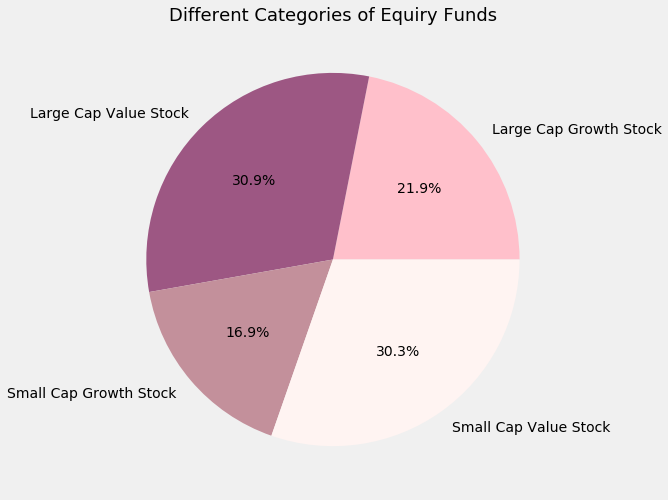

In [123]:
fig, ax = plt.subplots()
plt.style.use('fivethirtyeight')
colors = ['pink','#9d5783','#c3909b', '#fff4f2']
stockfund_beta.groupby('category')['SMB'].count().plot.pie(colors = colors, autopct = '%1.1f%%', ax=ax, figsize=(12, 8))
ax.set_title('Different Categories of Equiry Funds', size=18)
ax.set_ylabel('')
# labels = ["Small Cap Value Stock", "Small Cap Growth Stock", "Large Cap Value Stock", "Large Cap Growth Stock"]
#plt.pie(stockfund_beta['category'].value_counts(), labels = labels, colors = colors, autopct = '%1.1f%%')

#### c. 

In [31]:
mf_list = df_mf.loc[df_mf["crsp_fundno"].isin(fund)]
mf_list['mtna'] = pd.to_numeric(mf_list['mtna'], errors='coerce')

/Users/jqh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [32]:
NAV= mf_list.groupby('crsp_fundno').agg({'mtna':'mean'})
Return = mf_list.groupby('crsp_fundno').agg({'mret':'mean'})
stockfund_beta['NAV'] = NAV
stockfund_beta['Return'] = Return*12

/Users/jqh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/Users/jqh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [33]:
fig = px.scatter(stockfund_beta, x='Return', y='NAV', color='category')  
#size = average asset value
fig.show()

<div class="alert alert-danger alertdanger" style="margin-top: 20px">
    <h2>Unsupervised Learning: KMeans</h2>

- In the previous section, we categorize mutual funds by manually setting thresholds of parameters
- We want to validate the heuristic method we have used, and explore if there exists more effective classifying method using Machine Learning

### a. Select the optimal k (i.e. number of clusters/categories)

In [127]:
from sklearn.cluster import KMeans

In [131]:
n_clusters = range(2, 21)
def kmeans(k):
    model = KMeans(k)
    X = beta_norm.iloc[:, [2,3,4]]  ## the features used: beta of SMB, beta of HML, scores
    model.fit(X)
    y_kmeans = model.predict(X)
    return model.inertia_

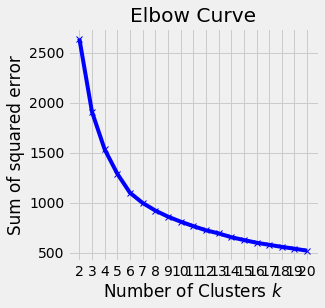

In [132]:
scores  = [kmeans(k) for k in n_clusters]
plt.figure(figsize=(4,4))
plt.plot(n_clusters,scores, 'bx-')
plt.xticks(range(2,21))
plt.xlabel('Number of Clusters $k$');
plt.ylabel('Sum of squared error');
plt.title('Elbow Curve');

- From the above curve, we could see that roughly at **k = 6**, the sum of squared error achieves an elbow point
- Hence we pick k = 6 as an optimal parameter of the model

### b. Fit the model and compare results

In [135]:
model = KMeans(6)
X = beta_norm.iloc[:, [2,3,4]]
model.fit(X)
y_kmeans = model.predict(X)
beta_norm['cat_pred'] = y_kmeans

/Users/jqh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [137]:
fig = px.scatter_3d(beta_norm, x='SMB', y='HML', z='scores', color='cat_pred', width=900, height=600)
fig.show()

#### Conclusion:
- From the plot, we can see that the KMeans model categorize the mutual funds into 6 clustors in a similar pattern as we did previously
    - For funds with scores lower than (0.24, 0.3), most are labeled as category 1
    - For funds with scores between 0.25 and 0.4, majority are labeled as category 3, with some others labeled as 4 or 5 (positive SMB)
    - For funds with scores above roughly 0.4, they are generally labeled into 4 categories based on signs of SML and HML
- We could conclude that our heuristic method of categorizing mutual funds based on scores (compatibility with FF3 model) and betas (size and value factors) are sound and reasonable in general.